#**Classifying Dog Breeds </h1>**

Machine learning can be used to identify images. In this project, we are going to identify breeds of dogs using CNN and the Stanford dogbreed dataset.

![dogs image](https://i.imgur.com/GNpLCsP.jpg)

**Dataset**

Stanford's Dog Breed dataset has been wonderfully annotated. It contains a

**Objective**

To identify the breed of a dog shown in a picture.

![dogs image](https://i.imgur.com/4mYqblX.jpg)

In [ ]:
#Google Colab GPU Connection info
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Not connected to a GPU


In [ ]:
#Google high-RAM runtime info
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 37.8 gigabytes of available RAM

You are using a high-RAM runtime!


In [ ]:
#importing necessary libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import StandardScaler
import os # accessing directory structure


In [ ]:
#ignoring warnings
import warnings
warnings.filterwarnings("ignore")

In [ ]:
#restrict float value to 3 decimal places
pd.set_option('display.float_format',lambda x: '%.3f' % x)
%matplotlib inline

In [ ]:
#allow access to google drive
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
#paths and folders setup for all breeds
image_raw_dir_all = '/content/gdrive/MyDrive/AI4ALL/Project/v4/Images/allbreeds/images/'
image_dir_all = '/content/gdrive/MyDrive/AI4ALL/Project/v4/Images/allbreeds/'
lists_dir_all = '/content/gdrive/MyDrive/AI4ALL/Project/v4/Lists/allbreeds/'
annotation_dir_all = '/content/gdrive/MyDrive/AI4ALL/Project/v4/Annotation/allbreeds/'

In [ ]:
dogbreeds_list_all = pd.read_csv(lists_dir_all + '/alldogs_file_list.csv')

#make a separate copy of the all dogs original df
dogbreeds_list_all_df = dogbreeds_list_all.copy()

#visualize head of dataframe
dogbreeds_list_all_df.head()

,file_list,annotation_list,labels
0,'n02085620-Chihuahua/n02085620_10074.jpg','n02085620-Chihuahua/n02085620_10074',1
1,'n02085620-Chihuahua/n02085620_10131.jpg','n02085620-Chihuahua/n02085620_10131',1
2,'n02085620-Chihuahua/n02085620_10621.jpg','n02085620-Chihuahua/n02085620_10621',1
3,'n02085620-Chihuahua/n02085620_1073.jpg','n02085620-Chihuahua/n02085620_1073',1
4,'n02085620-Chihuahua/n02085620_10976.jpg','n02085620-Chihuahua/n02085620_10976',1


In [ ]:
#number or records and number of unique records
num_breeds = len(dogbreeds_list_all_df['labels'].unique())
print("The original dataset contains ",len(dogbreeds_list_all_df), ' images of dogs, and ',num_breeds, " breeds.")

The original dataset contains  20580  images of dogs, and  120  breeds.


In [ ]:
#shape of dataframe
dogbreeds_list_all_df.shape

(20580, 3)

In [ ]:
#get the names of all breeds in the dataset, split "annotation_list"
dogbreeds_list_all_df[['folder_list','file']] = dogbreeds_list_all_df.annotation_list.str.split("/", expand= True)
dogbreeds_list_all_df

,file_list,annotation_list,labels,folder_list,file
0,'n02085620-Chihuahua/n02085620_10074.jpg','n02085620-Chihuahua/n02085620_10074',1,'n02085620-Chihuahua,n02085620_10074'
1,'n02085620-Chihuahua/n02085620_10131.jpg','n02085620-Chihuahua/n02085620_10131',1,'n02085620-Chihuahua,n02085620_10131'
2,'n02085620-Chihuahua/n02085620_10621.jpg','n02085620-Chihuahua/n02085620_10621',1,'n02085620-Chihuahua,n02085620_10621'
3,'n02085620-Chihuahua/n02085620_1073.jpg','n02085620-Chihuahua/n02085620_1073',1,'n02085620-Chihuahua,n02085620_1073'
4,'n02085620-Chihuahua/n02085620_10976.jpg','n02085620-Chihuahua/n02085620_10976',1,'n02085620-Chihuahua,n02085620_10976'
...,...,...,...,...,...
20575,'n02116738-African_hunting_dog/n02116738_9798....,'n02116738-African_hunting_dog/n02116738_9798',120,'n02116738-African_hunting_dog,n02116738_9798'
20576,'n02116738-African_hunting_dog/n02116738_9818....,'n02116738-African_hunting_dog/n02116738_9818',120,'n02116738-African_hunting_dog,n02116738_9818'
20577,'n02116738-African_hunting_dog/n02116738_9829....,'n02116738-African_hunting_dog/n02116738_9829',120,'n02116738-African_hunting_dog,n02116738_9829'
20578,'n02116738-African_hunting_dog/n02116738_9844....,'n02116738-African_hunting_dog/n02116738_9844',120,'n02116738-African_hunting_dog,n02116738_9844'


In [ ]:
#get the names of all breeds in the dataset, split "folder_list"
dogbreeds_list_all_df[['breedid','breed']]=dogbreeds_list_all_df['folder_list'].str.split("-",expand=True)

#split dog breed strings separated by "_"
dogbreeds_list_all_df[['temp1','temp2','temp3','temp4']] = dogbreeds_list_all_df['breed'].str.split("_", expand=True)

#concatenate the strings from the  temporary fields, don't add anything if it is a nan
dogbreeds_list_all_df['dogbreed'] = dogbreeds_list_all_df['temp1'] + " " + dogbreeds_list_all_df['temp2'].fillna('') + " "+ dogbreeds_list_all_df['temp3'].fillna('') + " " + dogbreeds_list_all_df['temp4'].fillna('')

#drop the temporary columns
dogbreeds_list_all_df.drop(columns=['temp1','temp2','temp3','temp4'], axis=1, inplace=True)

#remove trailing white spaces
dogbreeds_list_all_df['dogbreed'] = dogbreeds_list_all_df['dogbreed'].str.strip()
dogbreeds_list_all_df

,file_list,annotation_list,labels,folder_list,file,breedid,breed,dogbreed
0,'n02085620-Chihuahua/n02085620_10074.jpg','n02085620-Chihuahua/n02085620_10074',1,'n02085620-Chihuahua,n02085620_10074','n02085620,Chihuahua,Chihuahua
1,'n02085620-Chihuahua/n02085620_10131.jpg','n02085620-Chihuahua/n02085620_10131',1,'n02085620-Chihuahua,n02085620_10131','n02085620,Chihuahua,Chihuahua
2,'n02085620-Chihuahua/n02085620_10621.jpg','n02085620-Chihuahua/n02085620_10621',1,'n02085620-Chihuahua,n02085620_10621','n02085620,Chihuahua,Chihuahua
3,'n02085620-Chihuahua/n02085620_1073.jpg','n02085620-Chihuahua/n02085620_1073',1,'n02085620-Chihuahua,n02085620_1073','n02085620,Chihuahua,Chihuahua
4,'n02085620-Chihuahua/n02085620_10976.jpg','n02085620-Chihuahua/n02085620_10976',1,'n02085620-Chihuahua,n02085620_10976','n02085620,Chihuahua,Chihuahua
...,...,...,...,...,...,...,...,...
20575,'n02116738-African_hunting_dog/n02116738_9798....,'n02116738-African_hunting_dog/n02116738_9798',120,'n02116738-African_hunting_dog,n02116738_9798','n02116738,African_hunting_dog,African hunting dog
20576,'n02116738-African_hunting_dog/n02116738_9818....,'n02116738-African_hunting_dog/n02116738_9818',120,'n02116738-African_hunting_dog,n02116738_9818','n02116738,African_hunting_dog,African hunting dog
20577,'n02116738-African_hunting_dog/n02116738_9829....,'n02116738-African_hunting_dog/n02116738_9829',120,'n02116738-African_hunting_dog,n02116738_9829','n02116738,African_hunting_dog,African hunting dog
20578,'n02116738-African_hunting_dog/n02116738_9844....,'n02116738-African_hunting_dog/n02116738_9844',120,'n02116738-African_hunting_dog,n02116738_9844','n02116738,African_hunting_dog,African hunting dog


In [ ]:
dogbreed_chihuahua_df=dogbreeds_list_all_df.loc[dogbreeds_list_all_df['breed']=='Chihuahua']
dogbreed_chihuahua_df.head(50)

,file_list,annotation_list,labels,folder_list,file,breedid,breed,dogbreed
0,'n02085620-Chihuahua/n02085620_10074.jpg','n02085620-Chihuahua/n02085620_10074',1,'n02085620-Chihuahua,n02085620_10074','n02085620,Chihuahua,Chihuahua
1,'n02085620-Chihuahua/n02085620_10131.jpg','n02085620-Chihuahua/n02085620_10131',1,'n02085620-Chihuahua,n02085620_10131','n02085620,Chihuahua,Chihuahua
2,'n02085620-Chihuahua/n02085620_10621.jpg','n02085620-Chihuahua/n02085620_10621',1,'n02085620-Chihuahua,n02085620_10621','n02085620,Chihuahua,Chihuahua
3,'n02085620-Chihuahua/n02085620_1073.jpg','n02085620-Chihuahua/n02085620_1073',1,'n02085620-Chihuahua,n02085620_1073','n02085620,Chihuahua,Chihuahua
4,'n02085620-Chihuahua/n02085620_10976.jpg','n02085620-Chihuahua/n02085620_10976',1,'n02085620-Chihuahua,n02085620_10976','n02085620,Chihuahua,Chihuahua
5,'n02085620-Chihuahua/n02085620_11140.jpg','n02085620-Chihuahua/n02085620_11140',1,'n02085620-Chihuahua,n02085620_11140','n02085620,Chihuahua,Chihuahua
6,'n02085620-Chihuahua/n02085620_11238.jpg','n02085620-Chihuahua/n02085620_11238',1,'n02085620-Chihuahua,n02085620_11238','n02085620,Chihuahua,Chihuahua
7,'n02085620-Chihuahua/n02085620_11258.jpg','n02085620-Chihuahua/n02085620_11258',1,'n02085620-Chihuahua,n02085620_11258','n02085620,Chihuahua,Chihuahua
8,'n02085620-Chihuahua/n02085620_11337.jpg','n02085620-Chihuahua/n02085620_11337',1,'n02085620-Chihuahua,n02085620_11337','n02085620,Chihuahua,Chihuahua
9,'n02085620-Chihuahua/n02085620_11477.jpg','n02085620-Chihuahua/n02085620_11477',1,'n02085620-Chihuahua,n02085620_11477','n02085620,Chihuahua,Chihuahua


In [ ]:
#verify the length of strings
print("Length of ", dogbreeds_list_all_df['dogbreed'][0]," is ", len(dogbreeds_list_all_df['dogbreed'][0]))
print("Length of ", dogbreeds_list_all_df['dogbreed'][20579]," is ", len(dogbreeds_list_all_df['dogbreed'][20579]))

Length of  Chihuahua  is  9
Length of  African hunting dog  is  19


In [ ]:
#get all the breed names and the number of images per breed
dog_breed_count_all = dogbreeds_list_all_df['dogbreed'].value_counts()
print("Number of images per breed")
#print("--------------------------")
print(dog_breed_count_all.to_markdown())

Number of images per breed
|                                |   dogbreed |
|:-------------------------------|-----------:|
| Maltese dog                    |        252 |
| Afghan hound                   |        239 |
| Scottish deerhound             |        232 |
| Pomeranian                     |        219 |
| Bernese mountain dog           |        218 |
| Samoyed                        |        218 |
| Irish wolfhound                |        218 |
| Shih Tzu                       |        214 |
| Great Pyrenees                 |        213 |
| Leonberg                       |        210 |
| basenji                        |        209 |
| Tibetan terrier                |        206 |
| Sealyham terrier               |        202 |
| EntleBucher                    |        202 |
| Airedale                       |        202 |
| pug                            |        200 |
| Saluki                         |        200 |
| cairn                          |        197 |
| Lakeland te

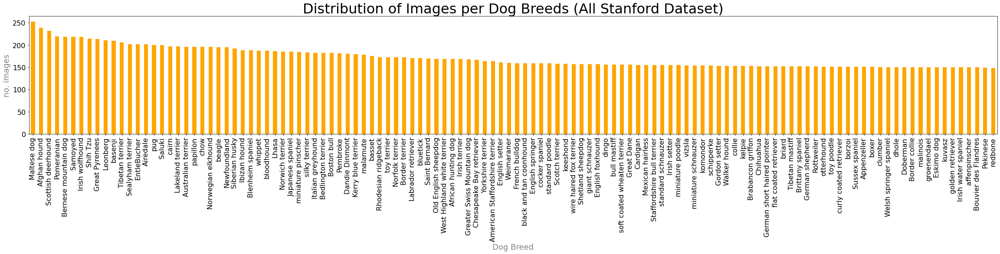

In [ ]:
plt.figure(figsize=(40,5))
dog_breed_count_all.plot(kind="bar", color = 'orange')
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.title("Distribution of Images per Dog Breeds (All Stanford Dataset)", fontsize = 32, color='black')

plt.xlabel('Dog Breed', fontsize = 18, color='grey')
plt.ylabel('no. images', fontsize = 18, color='grey')
plt.show()

In [ ]:
#import libraries to visualize images and augment them

import random
from skimage.io import imread
from skimage.transform import resize
from PIL import Image
import matplotlib.image as mpimg
from imgaug import augmenters as iaa


In [ ]:
#check images folder in google drive
import os
dogbreeds_imageraw_Folder_all = os.listdir(image_raw_dir_all)
dogbreeds_imageraw_Folder_all_sorted = sorted(os.listdir(image_raw_dir_all))

In [ ]:
#make a copy of the original data
dogbreeds_imageraw_Folder_all_df = dogbreeds_imageraw_Folder_all.copy()

In [ ]:
#convert to dataframe
dogbreeds_imageFolderList_all_df = pd.DataFrame(dogbreeds_imageraw_Folder_all_df)
dogbreeds_imageFolderList_all_df

,0
0,n02085620-Chihuahua
1,n02086079-Pekinese
2,n02086646-Blenheim_spaniel
3,n02085782-Japanese_spaniel
4,n02085936-Maltese_dog
...,...
115,n02095314-wire_haired_fox_terrier
116,n02098105-soft_coated_wheaten_terrier
117,n02099267-flat_coated_retriever
118,n02099429-curly_coated_retriever


In [ ]:
#list dataframe
dogbreeds_imageraw_Folder_all_df

['n02085620-Chihuahua',
 'n02086079-Pekinese',
 'n02086646-Blenheim_spaniel',
 'n02085782-Japanese_spaniel',
 'n02085936-Maltese_dog',
 'n02087046-toy_terrier',
 'n02086910-papillon',
 'n02088094-Afghan_hound',
 'n02087394-Rhodesian_ridgeback',
 'n02088364-beagle',
 'n02088238-basset',
 'n02088632-bluetick',
 'n02088466-bloodhound',
 'n02089867-Walker_hound',
 'n02089973-English_foxhound',
 'n02091134-whippet',
 'n02090721-Irish_wolfhound',
 'n02090379-redbone',
 'n02090622-borzoi',
 'n02091032-Italian_greyhound',
 'n02091244-Ibizan_hound',
 'n02091467-Norwegian_elkhound',
 'n02091635-otterhound',
 'n02091831-Saluki',
 'n02092002-Scottish_deerhound',
 'n02092339-Weimaraner',
 'n02093428-American_Staffordshire_terrier',
 'n02093256-Staffordshire_bullterrier',
 'n02094433-Yorkshire_terrier',
 'n02093859-Kerry_blue_terrier',
 'n02093647-Bedlington_terrier',
 'n02094114-Norfolk_terrier',
 'n02093991-Irish_terrier',
 'n02094258-Norwich_terrier',
 'n02093754-Border_terrier',
 'n02095889-Seal

In [ ]:
#get the breed name
dogbreeds_imageFolderList_all_df.rename(columns={0: 'folder_breed'}, inplace=True)
dogbreeds_imageFolderList_all_df
dogbreeds_imageFolderList_all_df[['breedid','breed']] = dogbreeds_imageFolderList_all_df['folder_breed'].str.split("-",expand=True)
dogbreeds_imageFolderList_all_df

,folder_breed,breedid,breed
0,n02085620-Chihuahua,n02085620,Chihuahua
1,n02086079-Pekinese,n02086079,Pekinese
2,n02086646-Blenheim_spaniel,n02086646,Blenheim_spaniel
3,n02085782-Japanese_spaniel,n02085782,Japanese_spaniel
4,n02085936-Maltese_dog,n02085936,Maltese_dog
...,...,...,...
115,n02095314-wire_haired_fox_terrier,n02095314,wire_haired_fox_terrier
116,n02098105-soft_coated_wheaten_terrier,n02098105,soft_coated_wheaten_terrier
117,n02099267-flat_coated_retriever,n02099267,flat_coated_retriever
118,n02099429-curly_coated_retriever,n02099429,curly_coated_retriever


In [ ]:
#split dog breed strings separated by "_"
dogbreeds_imageFolderList_all_df[['temp1','temp2','temp3','temp4']] = dogbreeds_imageFolderList_all_df['breed'].str.split("_", expand=True)

#concatenate the strings from the  temporary fields, don't add anything if it is a nan
dogbreeds_imageFolderList_all_df['dogbreed'] = dogbreeds_imageFolderList_all_df['temp1'] + " " + dogbreeds_imageFolderList_all_df['temp2'].fillna('') + " "+ dogbreeds_imageFolderList_all_df['temp3'].fillna('') + " " + dogbreeds_imageFolderList_all_df['temp4'].fillna('')

#drop the temporary columns
dogbreeds_imageFolderList_all_df.drop(columns=['temp1','temp2','temp3','temp4'], axis=1, inplace=True)

#remove trailing white spaces
dogbreeds_imageFolderList_all_df['dogbreed'] = dogbreeds_imageFolderList_all_df['dogbreed'].str.upper()
dogbreeds_imageFolderList_all_df['dogbreed'] = dogbreeds_imageFolderList_all_df['dogbreed'].str.strip()
dogbreeds_imageFolderList_all_df

,folder_breed,breedid,breed,dogbreed
0,n02085620-Chihuahua,n02085620,Chihuahua,CHIHUAHUA
1,n02086079-Pekinese,n02086079,Pekinese,PEKINESE
2,n02086646-Blenheim_spaniel,n02086646,Blenheim_spaniel,BLENHEIM SPANIEL
3,n02085782-Japanese_spaniel,n02085782,Japanese_spaniel,JAPANESE SPANIEL
4,n02085936-Maltese_dog,n02085936,Maltese_dog,MALTESE DOG
...,...,...,...,...
115,n02095314-wire_haired_fox_terrier,n02095314,wire_haired_fox_terrier,WIRE HAIRED FOX TERRIER
116,n02098105-soft_coated_wheaten_terrier,n02098105,soft_coated_wheaten_terrier,SOFT COATED WHEATEN TERRIER
117,n02099267-flat_coated_retriever,n02099267,flat_coated_retriever,FLAT COATED RETRIEVER
118,n02099429-curly_coated_retriever,n02099429,curly_coated_retriever,CURLY COATED RETRIEVER


# **Display Raw Images**

**Create a Function to display images using matplotlib.mpimg**

In [ ]:

#function to display the raw image of dogs
def show_folder_images_raw(dogbreed, no_images):
    plt.figure(figsize=(16,16))
    raw_image_dir = image_raw_dir_all+"{}/".format(dogbreed)
    images = os.listdir(raw_image_dir)[:no_images]
    print("Folder  : ", raw_image_dir)

    for i in range(no_images):

        #use matplotlib mpimg to read images
        img = mpimg.imread(raw_image_dir + images[i])


        #syntax subplot:
        #matplotlib.pyplot.subplots(nrows=1, ncols=1, *,
        #sharex=False, sharey=False, squeeze=True,
        #width_ratios=None, height_ratios=None,
        #subplot_kw=None, gridspec_kw=None, **fig_kw)

        #set padding spaces between subplots so there is no overlapping
        plt.tight_layout()

        #extract picture number
        img_index_jpg = os.path.basename(raw_image_dir + images[i]).split('_')
        img_index = img_index_jpg[1].split('.')

        plt.subplot(no_images/4+1, 4, i+1).set_title(img_index[0])
        plt.imshow(img)

        plt.axis('on')

Display raw images of the several dog breeds

First Doggy at  0
Breed   : CHIHUAHUA
Breed ID: n02085620
Folder  :  /content/gdrive/MyDrive/AI4ALL/Project/v4/Images/allbreeds/images/n02085620-Chihuahua/


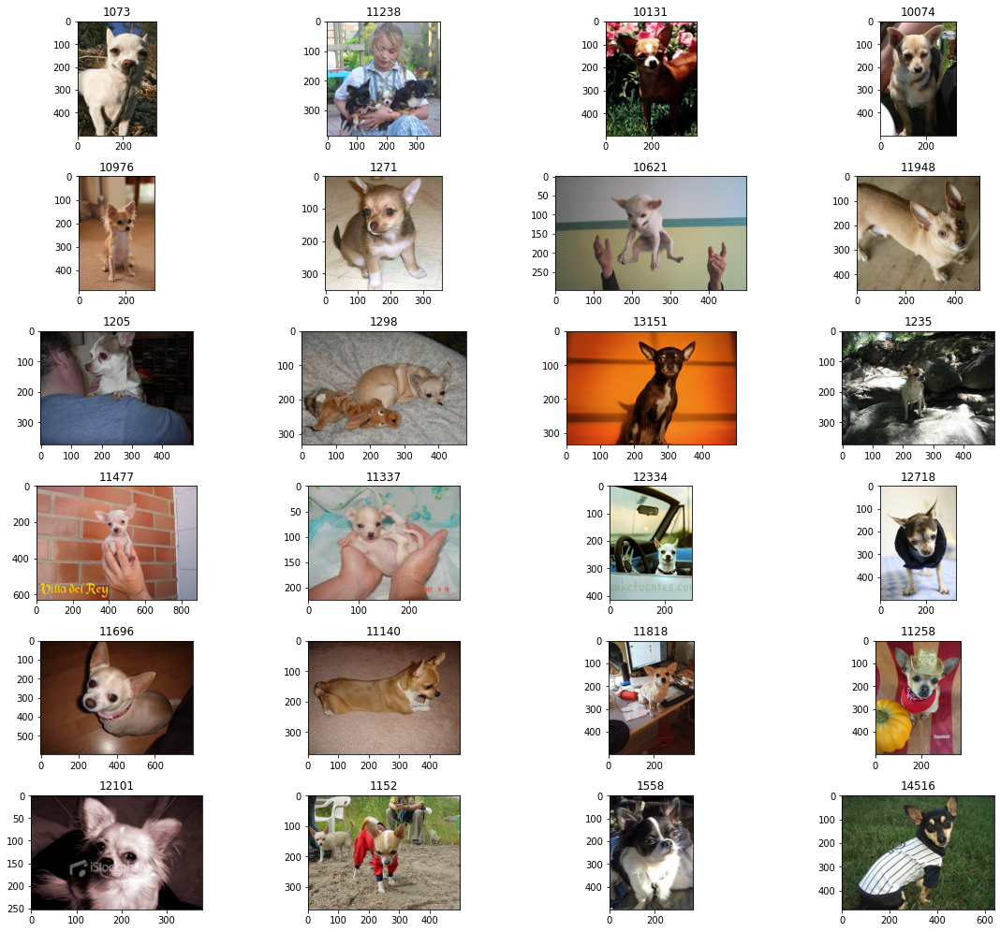

In [ ]:
#Display some images of the breed indexed 0
#randomdoggy = random.randrange(0,num_breeds-1)
print("First Doggy at ", 0)
dogbreed = dogbreeds_imageFolderList_all_df['dogbreed'][0]
print("Breed   : "+ dogbreed)
print("Breed ID: "+ dogbreeds_imageFolderList_all_df['breedid'][0])
show_folder_images_raw(dogbreeds_imageFolderList_all_df['folder_breed'][0], 24)
randoggy1=0

Random Doggy at  97
Breed   : NEWFOUNDLAND
Breed ID: n02085620
Folder  :  /content/gdrive/MyDrive/AI4ALL/Project/v4/Images/allbreeds/images/n02111277-Newfoundland/


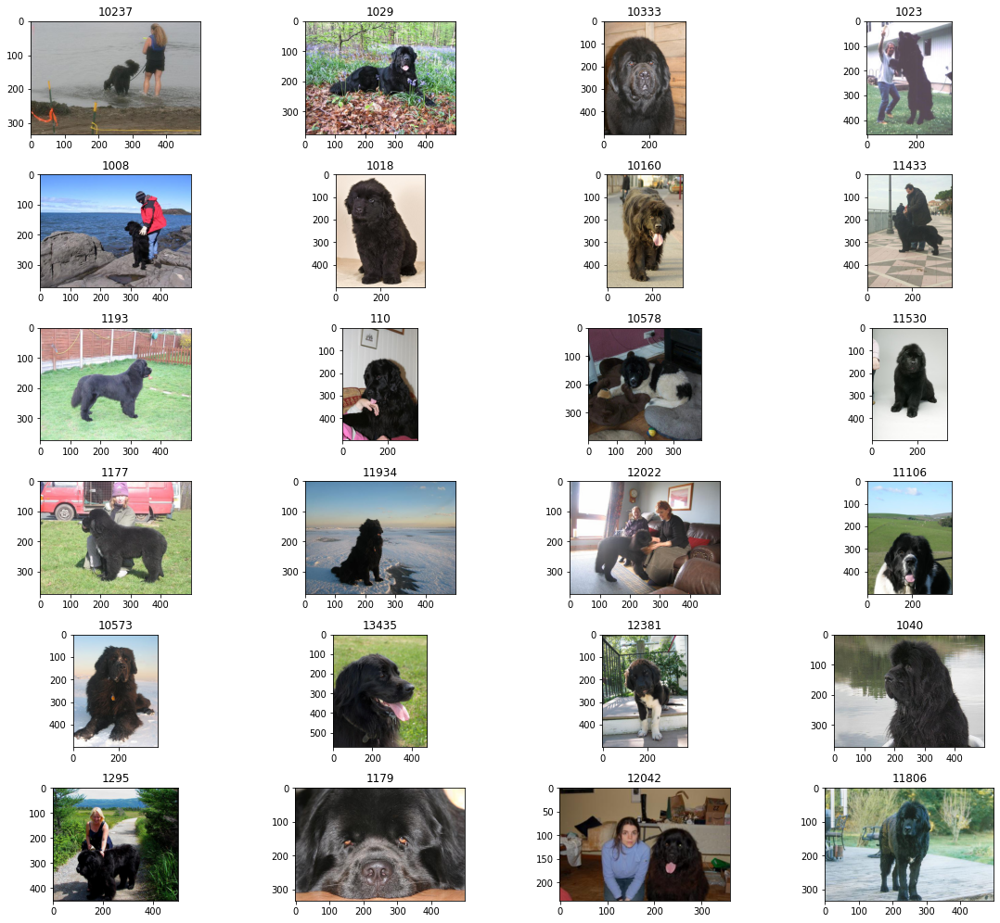

In [ ]:
#display some images of a random dog breed
randomdoggy = random.randrange(0,num_breeds-1)
print("Random Doggy at ", randomdoggy)
dogbreed = dogbreeds_imageFolderList_all_df['dogbreed'][randomdoggy]
print("Breed   : "+ dogbreed)
print("Breed ID: "+ dogbreeds_imageFolderList_all_df['breedid'][0])
show_folder_images_raw(dogbreeds_imageFolderList_all_df['folder_breed'][randomdoggy], 24)
randoggy2=randomdoggy

Random Doggy at  55
Breed   : CHESAPEAKE BAY RETRIEVER
Breed ID: n02085620
Folder  :  /content/gdrive/MyDrive/AI4ALL/Project/v4/Images/allbreeds/images/n02099849-Chesapeake_Bay_retriever/


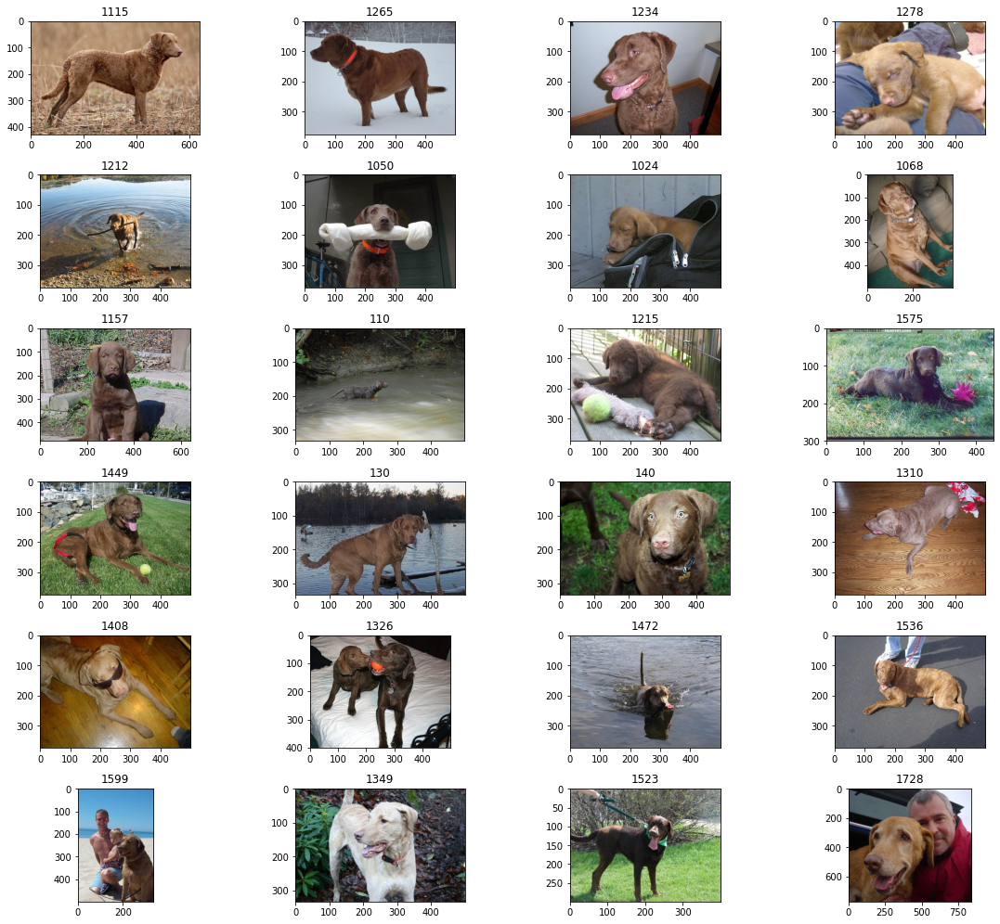

In [ ]:
randomdoggy = random.randrange(0,num_breeds-1)
print("Random Doggy at ", randomdoggy)
dogbreed = dogbreeds_imageFolderList_all_df['dogbreed'][randomdoggy]
print("Breed   : "+ dogbreed)
print("Breed ID: "+ dogbreeds_imageFolderList_all_df['breedid'][0])
show_folder_images_raw(dogbreeds_imageFolderList_all_df['folder_breed'][randomdoggy], 24)
randoggy3=randomdoggy

Random Doggy at  65
Breed   : OLD ENGLISH SHEEPDOG
Breed ID: n02085620
Folder  :  /content/gdrive/MyDrive/AI4ALL/Project/v4/Images/allbreeds/images/n02105641-Old_English_sheepdog/


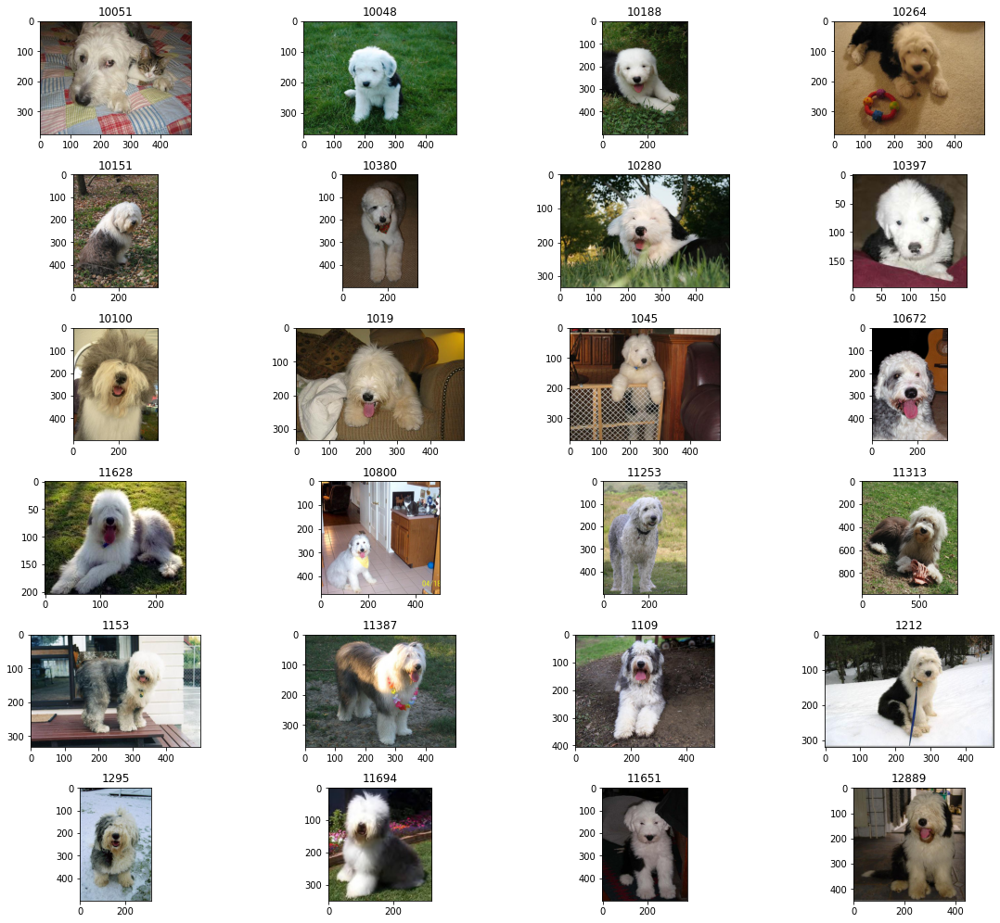

In [ ]:
randomdoggy = random.randrange(0,num_breeds-1)
print("Random Doggy at ", randomdoggy)
dogbreed = dogbreeds_imageFolderList_all_df['dogbreed'][randomdoggy]
print("Breed   : "+ dogbreed)
print("Breed ID: "+ dogbreeds_imageFolderList_all_df['breedid'][0])
show_folder_images_raw(dogbreeds_imageFolderList_all_df['folder_breed'][randomdoggy], 24)
randoggy4=randomdoggy

Random Doggy at  24
Breed   : SCOTTISH DEERHOUND
Breed ID: n02085620
Folder  :  /content/gdrive/MyDrive/AI4ALL/Project/v4/Images/allbreeds/images/n02092002-Scottish_deerhound/


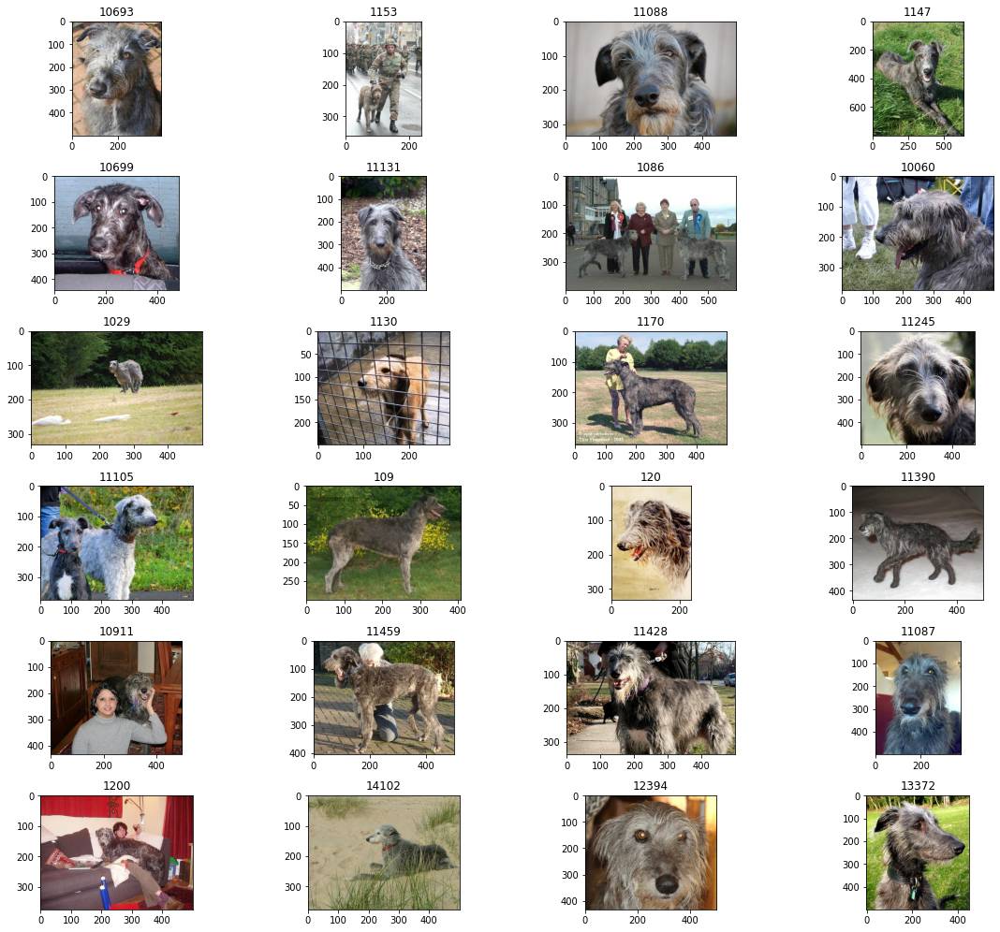

In [ ]:
randomdoggy = random.randrange(0,num_breeds-1)
print("Random Doggy at ", randomdoggy)
dogbreed = dogbreeds_imageFolderList_all_df['dogbreed'][randomdoggy]
print("Breed   : "+ dogbreed)
print("Breed ID: "+ dogbreeds_imageFolderList_all_df['breedid'][0])
show_folder_images_raw(dogbreeds_imageFolderList_all_df['folder_breed'][randomdoggy], 24)
randoggy5=randomdoggy

In [ ]:
#We will do this later
#what dog breed do you want to visualize?
#print('Enter your breed name:')
#breed_to_search = input()
#print('Searching for ' + breed_to_search)

# **Normalizing Images**

Creating Subfolders where to store normalized images

In [ ]:
#Create a folder to save normalized images
mainEditImages = False
subEditImages = False

editedImagesPath = image_dir_all + 'editedImages'
mainEditImages = os.path.exists(editedImagesPath)

In [ ]:

#main folder does not exist

subEditImagesPath = editedImagesPath+ '/' + dogbreed

if not mainEditImages:
  # Create directory to store editedImages
  os.makedirs(editedImagesPath)

 #prepare to create subfolders for every dog breed
  for dogbreed in dogbreeds_imageFolderList_all_df['folder_breed']:

    subEditImages = os.path.exists(subEditImagesPath)
    #now check if sub folders exist
    #subfolder does not exist:
    if not subEditImages:
      os.mkdir(subEditImagesPath)
      print('Created {} subfolder to store cropped images.'.format(dogbreed))
    #subfolder exists
    else:
      print('Did not create {} subfolder to store cropped image. Already exists.'.format(dogbreed))

#main folder exists
else:
  print("Folder <editedImages> not created. Already existed.")

  #prepare to create subfolders for every dog breed if necessary
  for dogbreed in dogbreeds_imageFolderList_all_df['folder_breed']:

    subEditImages = os.path.exists(subEditImagesPath)
    #main folder exists, but subfolders don't exist
    if not subEditImages:
      os.mkdir(subEditImagesPath)
      print('Created {} subfolder to store cropped images.'.format(dogbreed))
    #main folder exists and subfolders exist
    else:
      print('Did not create {} subfolder to store cropped image. Already exists.'.format(dogbreed))



Folder <editedImages> not created. Already existed.
Created n02085620-Chihuahua subfolder to store cropped images.
Did not create n02086079-Pekinese subfolder to store cropped image. Already exists.
Did not create n02086646-Blenheim_spaniel subfolder to store cropped image. Already exists.
Did not create n02085782-Japanese_spaniel subfolder to store cropped image. Already exists.
Did not create n02085936-Maltese_dog subfolder to store cropped image. Already exists.
Did not create n02087046-toy_terrier subfolder to store cropped image. Already exists.
Did not create n02086910-papillon subfolder to store cropped image. Already exists.
Did not create n02088094-Afghan_hound subfolder to store cropped image. Already exists.
Did not create n02087394-Rhodesian_ridgeback subfolder to store cropped image. Already exists.
Did not create n02088364-beagle subfolder to store cropped image. Already exists.
Did not create n02088238-basset subfolder to store cropped image. Already exists.
Did not crea

Normalizing images using ElementTree to parse through JSON annotation files

In [ ]:
#Important Note: Do not run this cell if you have already done it and normalized images. If you do, it will destroy all previously normalized images.

import xml.etree.ElementTree as ET

#so the first image is 0 as the first index
imgno = -1

#now lets try resizing

#for this we are going to use the annotation directory
for dogbreed in os.listdir(editedImagesPath):
    for file in os.listdir(annotation_dir_all+'{}'.format(dogbreed)):
        img = Image.open(image_raw_dir_all+'{}/{}.jpg'.format(dogbreed, file))
        tree = ET.parse(annotation_dir_all + '{}/{}'.format(dogbreed, file))
        xmin = int(tree.getroot().findall('object')[0].find('bndbox').find('xmin').text)
        xmax = int(tree.getroot().findall('object')[0].find('bndbox').find('xmax').text)
        ymin = int(tree.getroot().findall('object')[0].find('bndbox').find('ymin').text)
        ymax = int(tree.getroot().findall('object')[0].find('bndbox').find('ymax').text)
        img = img.crop((xmin, ymin, xmax, ymax))
        img = img.convert('RGB')

        img = img.resize((224, 224))
        imgno = imgno +1
        per = (imgno/len(dogbreeds_list_all_df))*100
        img.save(editedImagesPath+'/' + dogbreed + '/' + file + '.jpg')
        print("Saved Img# "+str(imgno+1)+" : "+str(f'{per:.3f}')+"% "+editedImagesPath+'/' + dogbreed + '/' + file + '.jpg')

Streaming output truncated to the last 5000 lines.
Saved Img# 15581 : 75.705% /content/gdrive/MyDrive/AI4ALL/Project/v4/Images/allbreeds/editedImages/n02109961-Eskimo_dog/n02109961_1633.jpg
Saved Img# 15582 : 75.709% /content/gdrive/MyDrive/AI4ALL/Project/v4/Images/allbreeds/editedImages/n02109961-Eskimo_dog/n02109961_17033.jpg
Saved Img# 15583 : 75.714% /content/gdrive/MyDrive/AI4ALL/Project/v4/Images/allbreeds/editedImages/n02109961-Eskimo_dog/n02109961_15315.jpg
Saved Img# 15584 : 75.719% /content/gdrive/MyDrive/AI4ALL/Project/v4/Images/allbreeds/editedImages/n02109961-Eskimo_dog/n02109961_135.jpg
Saved Img# 15585 : 75.724% /content/gdrive/MyDrive/AI4ALL/Project/v4/Images/allbreeds/editedImages/n02109961-Eskimo_dog/n02109961_1328.jpg
Saved Img# 15586 : 75.729% /content/gdrive/MyDrive/AI4ALL/Project/v4/Images/allbreeds/editedImages/n02109961-Eskimo_dog/n02109961_16953.jpg
Saved Img# 15587 : 75.734% /content/gdrive/MyDrive/AI4ALL/Project/v4/Images/allbreeds/editedImages/n02109961-Eski

FileNotFoundError: ignored

In [ ]:
#function to display image of edited dogs
image_dir_edited = image_dir_all+'editedImages/'

#function to display the raw image of dogs
def show_dir_images_edited(dogbreed, no_images):
    plt.figure(figsize=(16,16))
    img_folder_edited = image_dir_edited+"/{}/".format(dogbreed)
    images = os.listdir(img_folder_edited)[:no_images]
    print("Folder  : ", img_folder_edited)

    for i in range(no_images):

        #use matplotlib mpimg to read images
        img = mpimg.imread(img_folder_edited + images[i])


        #syntax subplot:
        #matplotlib.pyplot.subplots(nrows=1, ncols=1, *,
        #sharex=False, sharey=False, squeeze=True,
        #width_ratios=None, height_ratios=None,
        #subplot_kw=None, gridspec_kw=None, **fig_kw)

        #set padding spaces between subplots so there is no overlapping
        plt.tight_layout()

        #extract picture number
        img_index_jpg = os.path.basename(img_folder_edited + images[i]).split('_')
        img_index = img_index_jpg[1].split('.')

        plt.subplot(no_images/4+1, 4, i+1).set_title(img_index[0])
        plt.imshow(img)

        plt.axis('on')


Raw images
Random Doggy at  0
Breed   : CHIHUAHUA
Breed ID: n02085620
Folder  :  /content/gdrive/MyDrive/AI4ALL/Project/v4/Images/allbreeds/images/n02085620-Chihuahua/


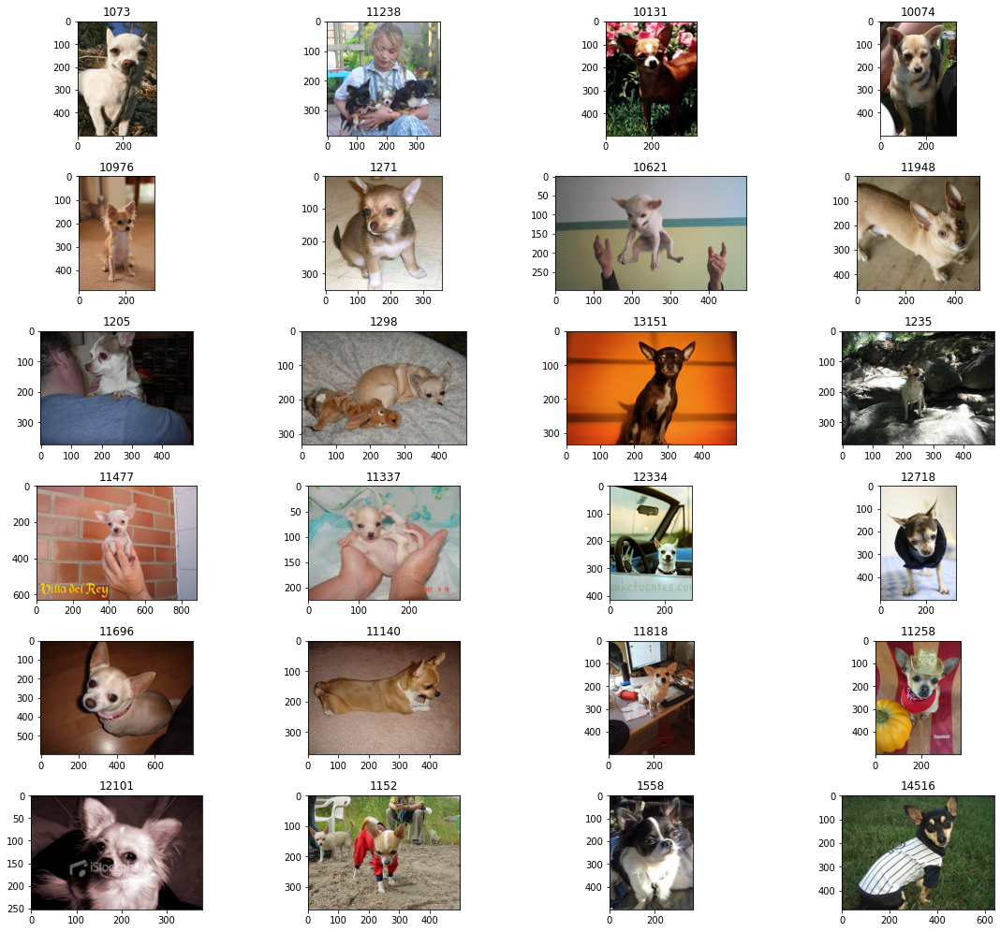

In [ ]:
#compare to first doggy - raw image
randoggy1=0
print("Raw images")
print("Random Doggy at ", randoggy1)
dogbreed = dogbreeds_imageFolderList_all_df['dogbreed'][randoggy1]

print("Breed   : "+ dogbreed)
print("Breed ID: "+ dogbreeds_imageFolderList_all_df['breedid'][0])
show_folder_images_raw(dogbreeds_imageFolderList_all_df['folder_breed'][randoggy1], 24)


Edited images
Random Doggy at  0
Breed   : CHIHUAHUA
Breed ID: n02085620
Folder  :  /content/gdrive/MyDrive/AI4ALL/Project/v4/Images/allbreeds/editedImages//n02085620-Chihuahua/


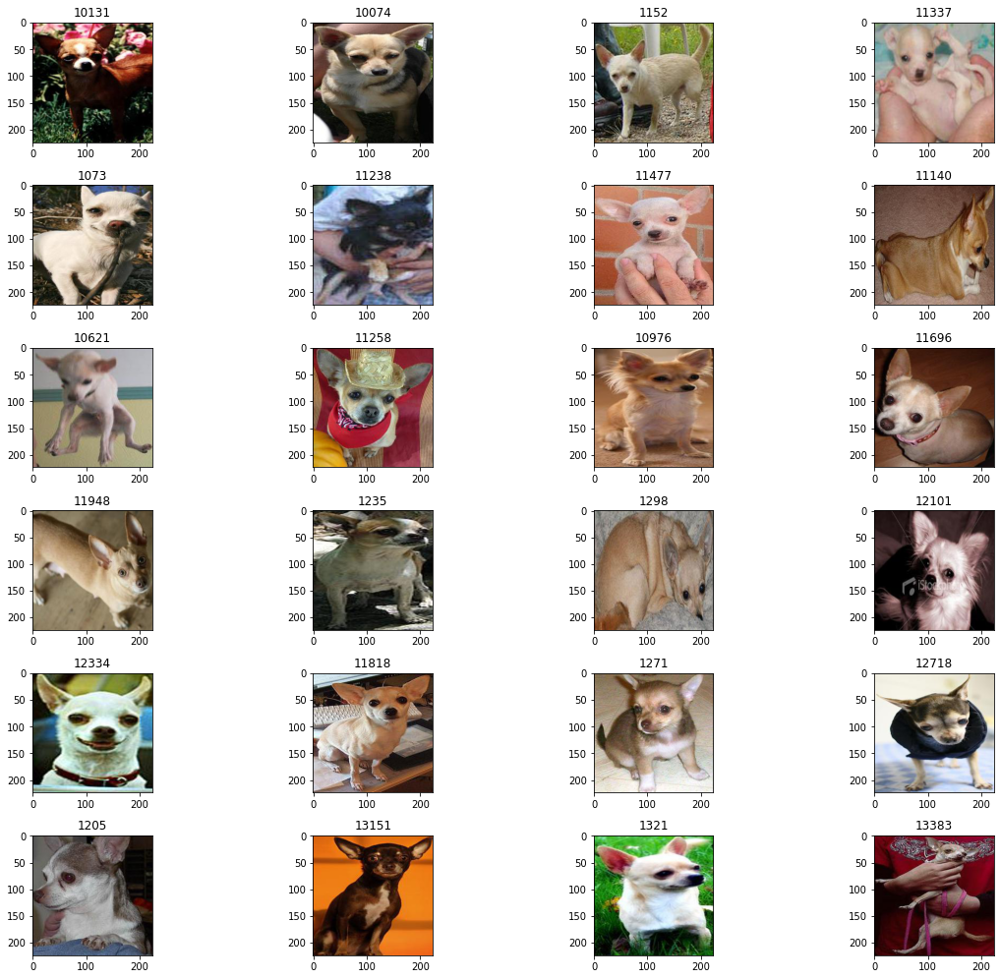

In [ ]:
#print edited
print("Edited images")

randoggy1=0
print("Random Doggy at ", randoggy1)
dogbreed = dogbreeds_imageFolderList_all_df['dogbreed'][randoggy1]

print("Breed   : "+ dogbreed)
print("Breed ID: "+ dogbreeds_imageFolderList_all_df['breedid'][0])

show_dir_images_edited(dogbreeds_imageFolderList_all_df['folder_breed'][randoggy1], 24)

We know that running the entire dataset will require a lot of computational power. We have tried this and we have not gotten very far. So lets try with a smaller dataset for now that contains only 10 breeds.


## **Trying with the Entire Dataset (120 breeds)**

In [ ]:
!pip install np_utils

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 61 kB 496 kB/s 
  Created wheel for np-utils: filename=np_utils-0.6.0-py3-none-any.whl size=56460 sha256=9f47407d19ebec3e4d503e38934b12fd3e75e4d39efc1b3aec9618b64135db84
  Stored in directory: /root/.cache/pip/wheels/55/8b/e7/a23fd46c709c21e3e6fcb55978d88b018f80d54018459978c3
Successfully built np-utils


In [ ]:
from skimage.io import imread
from skimage.transform import resize
from PIL import Image
from imgaug import augmenters as iaa

from sklearn.model_selection import train_test_split

#import keras
from keras.models import *
from keras.layers import *
from keras.optimizers import *
from keras.utils import *
from keras.callbacks import *

from keras.applications.densenet import DenseNet121, preprocess_input

In [ ]:
from keras.utils import np_utils
from keras.utils import to_categorical

In [ ]:
image_dir_edited

'/content/gdrive/MyDrive/AI4ALL/Project/v4/Images/allbreeds/editedImages/'

In [ ]:
breed_list_all = os.listdir(image_dir_edited)
breed_list_all

['n02085620-Chihuahua',
 'n02086079-Pekinese',
 'n02086646-Blenheim_spaniel',
 'n02085782-Japanese_spaniel',
 'n02085936-Maltese_dog',
 'n02087046-toy_terrier',
 'n02086910-papillon',
 'n02088094-Afghan_hound',
 'n02087394-Rhodesian_ridgeback',
 'n02088364-beagle',
 'n02088238-basset',
 'n02088632-bluetick',
 'n02088466-bloodhound',
 'n02089867-Walker_hound',
 'n02089973-English_foxhound',
 'n02091134-whippet',
 'n02090721-Irish_wolfhound',
 'n02090379-redbone',
 'n02090622-borzoi',
 'n02091032-Italian_greyhound',
 'n02091244-Ibizan_hound',
 'n02091467-Norwegian_elkhound',
 'n02091635-otterhound',
 'n02091831-Saluki',
 'n02092002-Scottish_deerhound',
 'n02092339-Weimaraner',
 'n02093428-American_Staffordshire_terrier',
 'n02093256-Staffordshire_bullterrier',
 'n02094433-Yorkshire_terrier',
 'n02093859-Kerry_blue_terrier',
 'n02093647-Bedlington_terrier',
 'n02094114-Norfolk_terrier',
 'n02093991-Irish_terrier',
 'n02094258-Norwich_terrier',
 'n02093754-Border_terrier',
 'n02095889-Seal

In [ ]:
dogbreeds_imageraw_Folder_all_df

['n02085620-Chihuahua',
 'n02086079-Pekinese',
 'n02086646-Blenheim_spaniel',
 'n02085782-Japanese_spaniel',
 'n02085936-Maltese_dog',
 'n02087046-toy_terrier',
 'n02086910-papillon',
 'n02088094-Afghan_hound',
 'n02087394-Rhodesian_ridgeback',
 'n02088364-beagle',
 'n02088238-basset',
 'n02088632-bluetick',
 'n02088466-bloodhound',
 'n02089867-Walker_hound',
 'n02089973-English_foxhound',
 'n02091134-whippet',
 'n02090721-Irish_wolfhound',
 'n02090379-redbone',
 'n02090622-borzoi',
 'n02091032-Italian_greyhound',
 'n02091244-Ibizan_hound',
 'n02091467-Norwegian_elkhound',
 'n02091635-otterhound',
 'n02091831-Saluki',
 'n02092002-Scottish_deerhound',
 'n02092339-Weimaraner',
 'n02093428-American_Staffordshire_terrier',
 'n02093256-Staffordshire_bullterrier',
 'n02094433-Yorkshire_terrier',
 'n02093859-Kerry_blue_terrier',
 'n02093647-Bedlington_terrier',
 'n02094114-Norfolk_terrier',
 'n02093991-Irish_terrier',
 'n02094258-Norwich_terrier',
 'n02093754-Border_terrier',
 'n02095889-Seal

In [ ]:
num_classes = len(breed_list_all)
print(num_classes)

120


In [ ]:
dict_label = {}
dict_reverse_label = {}
for i, v in enumerate(breed_list_all):
    dict_label.update({v: i})
    dict_reverse_label.update({i : v})

In [ ]:
dict_label

{'n02085620-Chihuahua': 0,
 'n02086079-Pekinese': 1,
 'n02086646-Blenheim_spaniel': 2,
 'n02085782-Japanese_spaniel': 3,
 'n02085936-Maltese_dog': 4,
 'n02087046-toy_terrier': 5,
 'n02086910-papillon': 6,
 'n02088094-Afghan_hound': 7,
 'n02087394-Rhodesian_ridgeback': 8,
 'n02088364-beagle': 9,
 'n02088238-basset': 10,
 'n02088632-bluetick': 11,
 'n02088466-bloodhound': 12,
 'n02089867-Walker_hound': 13,
 'n02089973-English_foxhound': 14,
 'n02091134-whippet': 15,
 'n02090721-Irish_wolfhound': 16,
 'n02090379-redbone': 17,
 'n02090622-borzoi': 18,
 'n02091032-Italian_greyhound': 19,
 'n02091244-Ibizan_hound': 20,
 'n02091467-Norwegian_elkhound': 21,
 'n02091635-otterhound': 22,
 'n02091831-Saluki': 23,
 'n02092002-Scottish_deerhound': 24,
 'n02092339-Weimaraner': 25,
 'n02093428-American_Staffordshire_terrier': 26,
 'n02093256-Staffordshire_bullterrier': 27,
 'n02094433-Yorkshire_terrier': 28,
 'n02093859-Kerry_blue_terrier': 29,
 'n02093647-Bedlington_terrier': 30,
 'n02094114-Norfolk

In [ ]:
dict_reverse_label

{0: 'n02085620-Chihuahua',
 1: 'n02086079-Pekinese',
 2: 'n02086646-Blenheim_spaniel',
 3: 'n02085782-Japanese_spaniel',
 4: 'n02085936-Maltese_dog',
 5: 'n02087046-toy_terrier',
 6: 'n02086910-papillon',
 7: 'n02088094-Afghan_hound',
 8: 'n02087394-Rhodesian_ridgeback',
 9: 'n02088364-beagle',
 10: 'n02088238-basset',
 11: 'n02088632-bluetick',
 12: 'n02088466-bloodhound',
 13: 'n02089867-Walker_hound',
 14: 'n02089973-English_foxhound',
 15: 'n02091134-whippet',
 16: 'n02090721-Irish_wolfhound',
 17: 'n02090379-redbone',
 18: 'n02090622-borzoi',
 19: 'n02091032-Italian_greyhound',
 20: 'n02091244-Ibizan_hound',
 21: 'n02091467-Norwegian_elkhound',
 22: 'n02091635-otterhound',
 23: 'n02091831-Saluki',
 24: 'n02092002-Scottish_deerhound',
 25: 'n02092339-Weimaraner',
 26: 'n02093428-American_Staffordshire_terrier',
 27: 'n02093256-Staffordshire_bullterrier',
 28: 'n02094433-Yorkshire_terrier',
 29: 'n02093859-Kerry_blue_terrier',
 30: 'n02093647-Bedlington_terrier',
 31: 'n02094114-Nor

In [ ]:
#Paths definition
def labelspaths():
  #create three empty lists
    paths = list()
    labels = list()
    targets = list()

    for breed in dogbreeds_imageraw_Folder_all_df:
        base_name = editedImagesPath+"/{}/".format(breed)
        print("base_name: ",base_name)
        for image_name in os.listdir(base_name):
            paths.append(base_name + image_name)
            labels.append(breed)
            targets.append(dict_label[breed])
    return paths, labels, targets

paths, labels, targets = labelspaths()

assert len(paths) == len(labels)
assert len(paths) == len(targets)

targets = np_utils.to_categorical(targets, num_classes = num_classes)

base_name:  /content/gdrive/MyDrive/AI4ALL/Project/v4/Images/allbreeds/editedImages/n02085620-Chihuahua/
base_name:  /content/gdrive/MyDrive/AI4ALL/Project/v4/Images/allbreeds/editedImages/n02086079-Pekinese/
base_name:  /content/gdrive/MyDrive/AI4ALL/Project/v4/Images/allbreeds/editedImages/n02086646-Blenheim_spaniel/
base_name:  /content/gdrive/MyDrive/AI4ALL/Project/v4/Images/allbreeds/editedImages/n02085782-Japanese_spaniel/
base_name:  /content/gdrive/MyDrive/AI4ALL/Project/v4/Images/allbreeds/editedImages/n02085936-Maltese_dog/
base_name:  /content/gdrive/MyDrive/AI4ALL/Project/v4/Images/allbreeds/editedImages/n02087046-toy_terrier/
base_name:  /content/gdrive/MyDrive/AI4ALL/Project/v4/Images/allbreeds/editedImages/n02086910-papillon/
base_name:  /content/gdrive/MyDrive/AI4ALL/Project/v4/Images/allbreeds/editedImages/n02088094-Afghan_hound/
base_name:  /content/gdrive/MyDrive/AI4ALL/Project/v4/Images/allbreeds/editedImages/n02087394-Rhodesian_ridgeback/
base_name:  /content/gdriv

In [ ]:
targets

array([[1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.]], dtype=float32)

In [ ]:
#ImageGenerator class
batch_size = 64

class ImageGenerator(Sequence):

    def __init__(self, paths, targets, batch_size, shape, augment=False):
        self.paths = paths
        self.targets = targets
        self.batch_size = batch_size
        self.shape = shape
        self.augment = augment

    def __len__(self):
        return int(np.ceil(len(self.paths) / float(self.batch_size)))

    def __getitem__(self, idx):
        batch_paths = self.paths[idx * self.batch_size : (idx + 1) * self.batch_size]
        x = np.zeros((len(batch_paths), self.shape[0], self.shape[1], self.shape[2]), dtype=np.float32)
        y = np.zeros((self.batch_size, num_classes, 1))
        for i, path in enumerate(batch_paths):
            x[i] = self.__load_image(path)
        y = self.targets[idx * self.batch_size : (idx + 1) * self.batch_size]
        return x, y

    def __iter__(self):
        for item in (self[i] for i in range(len(self))):
            yield item

    def __load_image(self, path):
        image = imread(path)
        image = preprocess_input(image)
        if self.augment:
            seq = iaa.Sequential([
                iaa.OneOf([
                    iaa.Fliplr(0.5),
                    iaa.Flipud(0.5),
                    iaa.CropAndPad(percent=(-0.25, 0.25)),
                    iaa.Crop(percent=(0, 0.1)),
                    iaa.Sometimes(0.5,
                        iaa.GaussianBlur(sigma=(0, 0.5))
                    ),
                    iaa.Affine(
                        scale={"x": (0.8, 1.2), "y": (0.8, 1.2)},
                        translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)},
                        rotate=(-180, 180),
                        shear=(-8, 8)
                    )
                ])
            ], random_order=True)
            image = seq.augment_image(image)
        return image

In [ ]:
train_paths, test_paths, train_targets, test_targets = train_test_split(paths,
                                                  targets,
                                                  test_size=0.15,
                                                  random_state=1)

train_X = ImageGenerator(train_paths, train_targets, batch_size=32, shape=(224,224,3), augment=True)
test_y = ImageGenerator(test_paths, test_targets, batch_size=32, shape=(224,224,3), augment=False)

In [ ]:
#Use imagenet weights, softmax, relu
input_all = Input((224, 224, 3))
backbone_all = DenseNet121(input_tensor=input_all,
                       weights="imagenet",
                       include_top=False)
x = backbone_all.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation="relu")(x)
x = Dropout(0.5)(x)
x = Dense(512, activation="relu")(x)
x = Dropout(0.5)(x)
output_all = Dense(num_classes, activation="softmax")(x)

model_all = Model(input_all, output_all)

29084464/29084464 [==============================] - 0s 0us/step


In [ ]:
for layer in model_all.layers[:-6]:
    layer.trainable = False

In [ ]:
model_all.compile(optimizer="adam",
              loss="categorical_crossentropy",
              metrics=["acc"])

In [ ]:
#Train the model
training_log = model_all.fit_generator(generator=train_X,
                              steps_per_epoch=len(train_X),
                              validation_data=test_y,
                              validation_steps=len(test_y),
                              epochs=20)

Epoch 1/20
547/547 [==============================] - 4797s 9s/step - loss: 2.7111 - acc: 0.3261 - val_loss: 0.8231 - val_acc: 0.7483
Epoch 2/20
547/547 [==============================] - 409s 747ms/step - loss: 1.5849 - acc: 0.5413 - val_loss: 0.6964 - val_acc: 0.7781
Epoch 3/20
547/547 [==============================] - 421s 770ms/step - loss: 1.4173 - acc: 0.5940 - val_loss: 0.6215 - val_acc: 0.8050
Epoch 4/20
547/547 [==============================] - 418s 764ms/step - loss: 1.3451 - acc: 0.6094 - val_loss: 0.6486 - val_acc: 0.7920
Epoch 5/20
547/547 [==============================] - 423s 772ms/step - loss: 1.2979 - acc: 0.6234 - val_loss: 0.6038 - val_acc: 0.8037
Epoch 6/20
547/547 [==============================] - 426s 779ms/step - loss: 1.2535 - acc: 0.6377 - val_loss: 0.6150 - val_acc: 0.8017
Epoch 7/20
547/547 [==============================] - 425s 776ms/step - loss: 1.2528 - acc: 0.6344 - val_loss: 0.5865 - val_acc: 0.8076
Epoch 8/20
547/547 [==============================

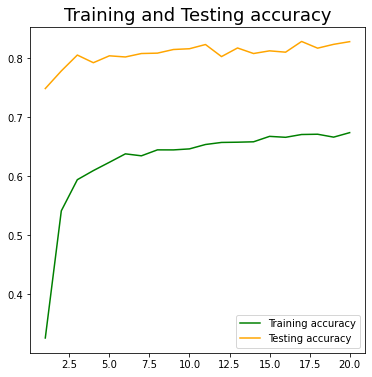

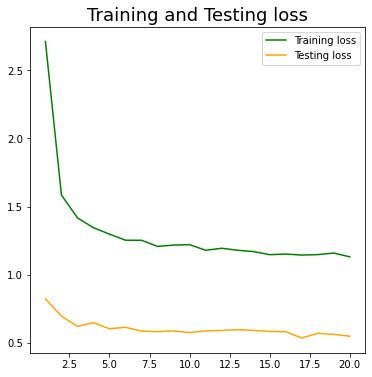

In [ ]:
plt.rcParams['figure.figsize'] = (6,6)

train_accuracy = training_log.history['acc']
test_accuracy = training_log.history['val_acc']
train_loss = training_log.history['loss']
test_loss = training_log.history['val_loss']
epochs = range(1, len(train_accuracy) + 1)

plt.title('Training and Testing accuracy', fontsize = 18)
plt.plot(epochs, train_accuracy, 'green', label='Training accuracy')
plt.plot(epochs, test_accuracy, 'orange', label='Testing accuracy')
plt.legend()

plt.figure()
plt.title('Training and Testing loss', fontsize= 18)
plt.plot(epochs, train_loss, 'green', label='Training loss')
plt.plot(epochs, test_loss, 'orange', label='Testing loss')

plt.legend()

plt.show()

In [ ]:
for layer in model_all.layers[:]:
    layer.trainable = True

In [ ]:
!pip install pyyaml h5py

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# a check point callback to save our model including our best weights
best_weights = ModelCheckpoint('model_dogbreeds_classify.h5',
                             monitor='acc',
                             verbose=1,
                             save_best_only=True,
                             mode='max',
                             save_weights_only=True)

# a reducing lr callback to reduce lr when val_loss doesn't increase
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                                   patience=1, verbose=1, mode='min',
                                   min_delta=0.0001, cooldown=2, min_lr=1e-7)

# for early stop
early_stop = EarlyStopping(monitor="val_loss", mode="min", patience=5)

In [ ]:
training_log = model_all.fit_generator(generator=train_X,
                              steps_per_epoch=len(train_X),
                              validation_data=test_y,
                              validation_steps=len(test_y),
                              epochs=20,
                              callbacks=[best_weights, reduce_lr, early_stop])

Epoch 1/20
547/547 [==============================] - ETA: 0s - loss: 1.1396 - acc: 0.6704
Epoch 1: acc improved from -inf to 0.67044, saving model to model_dogbreeds_classify.h5
547/547 [==============================] - 434s 793ms/step - loss: 1.1396 - acc: 0.6704 - val_loss: 0.5641 - val_acc: 0.8231 - lr: 0.0010
Epoch 2/20
547/547 [==============================] - ETA: 0s - loss: 1.1416 - acc: 0.6789
Epoch 2: acc improved from 0.67044 to 0.67890, saving model to model_dogbreeds_classify.h5

Epoch 2: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.
547/547 [==============================] - 433s 792ms/step - loss: 1.1416 - acc: 0.6789 - val_loss: 0.5940 - val_acc: 0.8069 - lr: 0.0010
Epoch 3/20
547/547 [==============================] - ETA: 0s - loss: 0.9570 - acc: 0.7196
Epoch 3: acc improved from 0.67890 to 0.71960, saving model to model_dogbreeds_classify.h5
547/547 [==============================] - 431s 788ms/step - loss: 0.9570 - acc: 0.7196 - val_loss: 0.5

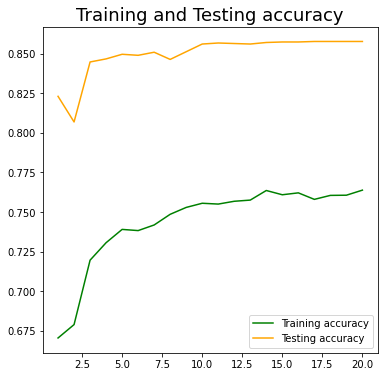

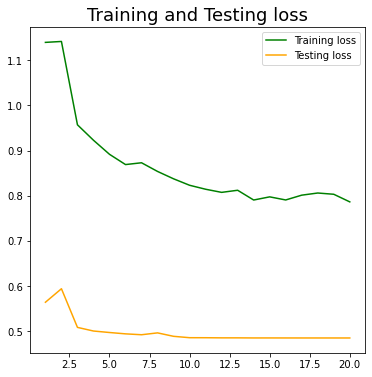

In [ ]:
plt.rcParams['figure.figsize'] = (6,6)

train_accuracy = training_log.history['acc']
test_accuracy = training_log.history['val_acc']
train_loss = training_log.history['loss']
test_loss = training_log.history['val_loss']
epochs = range(1, len(train_accuracy) + 1)

plt.title('Training and Testing accuracy', fontsize = 18)
plt.plot(epochs, train_accuracy, 'green', label='Training accuracy')
plt.plot(epochs,test_accuracy, 'orange', label='Testing accuracy')
plt.legend()

plt.figure()
plt.title('Training and Testing loss', fontsize = 18)
plt.plot(epochs, train_loss, 'green', label='Training loss')
plt.plot(epochs, test_loss, 'orange', label='Testing loss')

plt.legend()

plt.show()

In [ ]:
print(max(test_accuracy))

0.8577907085418701


In [ ]:
def predict(url, filename):
    # download and save
    os.system("curl -s {} -o {}".format(url, filename))
    img = Image.open(filename)
    img = img.convert('RGB')
    img = img.resize((224, 224))
    img.save(filename)
    # show image
    plt.figure(figsize=(4, 4))
    plt.imshow(img)
    plt.axis('off')
    # predict
    img = imread(filename)
    img = preprocess_input(img)
    probs = model_all.predict(np.expand_dims(img, axis=0))
    for idx in probs.argsort()[0][::-1][:5]:
        print("{:.2f}%".format(probs[0][idx]*100), "\t", dict_reverse_label[idx].split("-")[-1])

1/1 [==============================] - 2s 2s/step
96.01% 	 dingo
3.91% 	 dhole
0.05% 	 basenji
0.01% 	 Eskimo_dog
0.00% 	 whippet


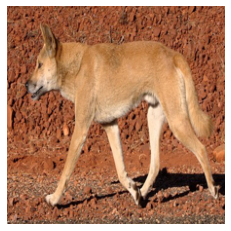

In [ ]:
predict("https://i.ibb.co/2qYRPFd/dingo-1.jpg", 'fullPrediction_1.jpg')

1/1 [==============================] - 0s 116ms/step
99.85% 	 Rottweiler
0.06% 	 black_and_tan_coonhound
0.06% 	 miniature_pinscher
0.01% 	 Gordon_setter
0.01% 	 Doberman


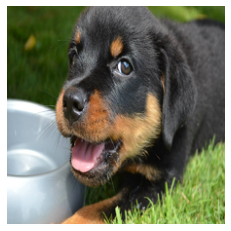

In [ ]:
predict("https://i.ibb.co/XzJf3fv/rotweiler-1.jpg", 'fullPrediction_2.jpg')

1/1 [==============================] - 0s 134ms/step
100.00% 	 Pekinese
0.00% 	 Brabancon_griffon
0.00% 	 Japanese_spaniel
0.00% 	 Shih_Tzu
0.00% 	 Lhasa


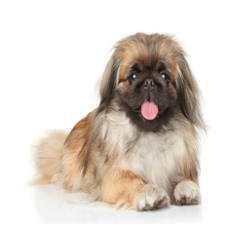

In [ ]:
predict("https://i.ibb.co/yQFVpsw/pekinese-1.jpg", 'fullPrediction_3.jpg')

1/1 [==============================] - 0s 115ms/step
99.90% 	 pug
0.05% 	 bull_mastiff
0.03% 	 French_bulldog
0.01% 	 boxer
0.00% 	 Brabancon_griffon


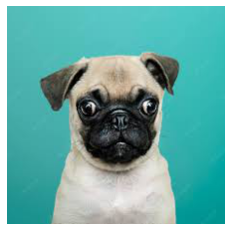

In [ ]:
predict("https://i.ibb.co/2nbqRn2/pug-1.jpg", 'fullPrediction_4.jpg')

1/1 [==============================] - 0s 113ms/step
90.95% 	 West_Highland_white_terrier
4.54% 	 Norfolk_terrier
2.04% 	 Scotch_terrier
1.55% 	 cairn
0.18% 	 Norwich_terrier


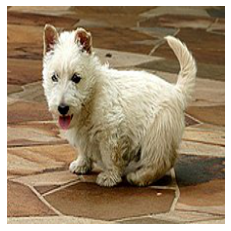

In [ ]:
predict("https://i.ibb.co/K9PM1X8/scotch-terrier-1.jpg", 'fullPrediction_5.jpg')

1/1 [==============================] - 0s 122ms/step
99.57% 	 Samoyed
0.43% 	 Great_Pyrenees
0.00% 	 Pomeranian
0.00% 	 kuvasz
0.00% 	 Eskimo_dog


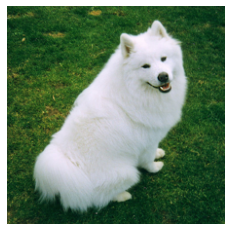

In [ ]:
predict("https://i.ibb.co/GJ9jYhs/samoyed-1.jpg", 'fullPrediction_6.jpg')

1/1 [==============================] - 0s 115ms/step
89.51% 	 Chihuahua
3.01% 	 Brabancon_griffon
1.74% 	 Boston_bull
1.24% 	 toy_terrier
1.22% 	 Pekinese


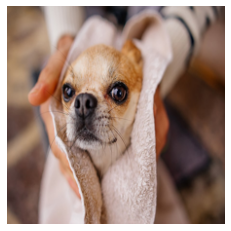

In [ ]:
predict("https://i.ibb.co/SXzdY5F/chihuahua-1.jpg", 'fullPrediction_7.jpg')

1/1 [==============================] - 0s 115ms/step
82.98% 	 English_springer
16.22% 	 cocker_spaniel
0.32% 	 Japanese_spaniel
0.15% 	 English_setter
0.10% 	 Blenheim_spaniel


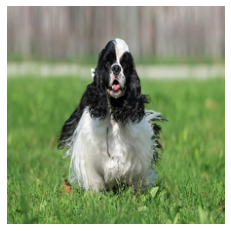

In [ ]:
predict("https://i.ibb.co/dG0Qjxx/cocker-spaniel-1.jpg", 'fullPrediction_8.jpg')

1/1 [==============================] - 0s 124ms/step
60.88% 	 toy_poodle
31.47% 	 miniature_poodle
1.50% 	 Lakeland_terrier
0.93% 	 Lhasa
0.86% 	 standard_poodle


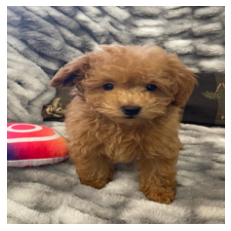

In [ ]:
predict("https://i.ibb.co/GWHzV79/toy-poodle-1.jpg", 'fullPrediction_9.jpg')

1/1 [==============================] - 0s 116ms/step
52.32% 	 Siberian_husky
39.22% 	 Eskimo_dog
8.44% 	 malamute
0.03% 	 Norwegian_elkhound
0.00% 	 collie


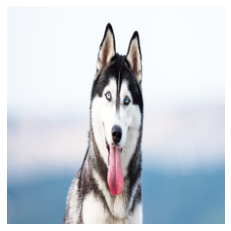

In [ ]:
predict("https://i.ibb.co/5nJZL2v/siberian-husky-1.jpg", 'fullPrediction_10.jpg')

1/1 [==============================] - 0s 113ms/step
52.98% 	 dingo
27.52% 	 basenji
4.83% 	 whippet
2.77% 	 Italian_greyhound
2.34% 	 American_Staffordshire_terrier


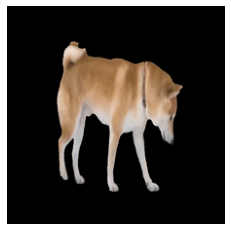

In [ ]:
predict("https://i.ibb.co/VS0F3Tw/shibainu.gif", 'fullPrediction_11.jpg')

1/1 [==============================] - 0s 114ms/step
90.42% 	 Mexican_hairless
2.24% 	 Italian_greyhound
0.97% 	 Doberman
0.76% 	 kelpie
0.74% 	 miniature_pinscher


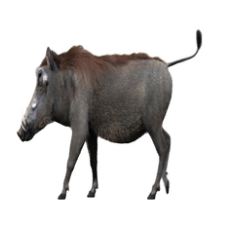

In [ ]:
predict("https://i.ibb.co/xj4RWgF/boar.jpg", 'fullPrediction_12.jpg')

1/1 [==============================] - 0s 120ms/step
23.37% 	 Mexican_hairless
4.78% 	 Chihuahua
4.03% 	 miniature_poodle
3.46% 	 Bedlington_terrier
3.22% 	 Italian_greyhound


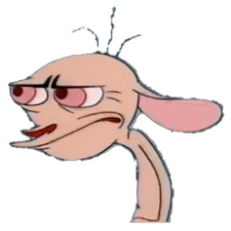

In [ ]:
predict("https://i.ibb.co/5FHLYHL/ren.jpg", 'fullPrediction_14.jpg')

1/1 [==============================] - 0s 114ms/step
72.65% 	 Shih_Tzu
17.84% 	 Lhasa
5.63% 	 Pekinese
3.75% 	 Maltese_dog
0.07% 	 Japanese_spaniel


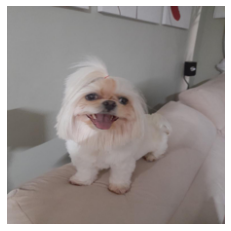

In [ ]:
predict("https://i.ibb.co/SdZvKgN/o4.jpg", 'fullPrediction_15.jpg')

1/1 [==============================] - 0s 121ms/step
5.79% 	 miniature_poodle
4.79% 	 standard_poodle
4.54% 	 komondor
4.37% 	 Bedlington_terrier
4.26% 	 toy_poodle


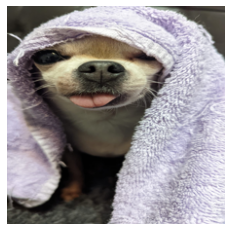

In [ ]:
predict("https://i.ibb.co/ygDbTD8/o3.jpg", 'fullPrediction_16.jpg')


1/1 [==============================] - 0s 125ms/step
98.88% 	 Chihuahua
0.83% 	 Boston_bull
0.19% 	 toy_terrier
0.09% 	 French_bulldog
0.00% 	 Italian_greyhound


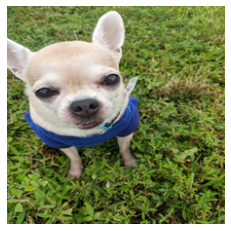

In [ ]:
predict("https://i.ibb.co/hB95Z13/o5.jpg", 'fullPrediction_17.jpg')

1/1 [==============================] - 0s 119ms/step
11.86% 	 Border_collie
5.03% 	 Shetland_sheepdog
5.01% 	 borzoi
4.63% 	 collie
4.61% 	 English_setter


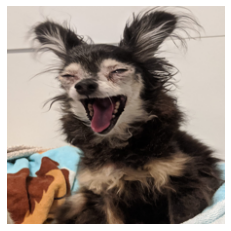

In [ ]:
predict("https://i.ibb.co/s9Wj9H5/o2.jpg", 'fullPrediction_18.jpg')

1/1 [==============================] - 0s 130ms/step
38.61% 	 Norwegian_elkhound
25.42% 	 keeshond
14.61% 	 German_shepherd
12.92% 	 African_hunting_dog
3.37% 	 malinois


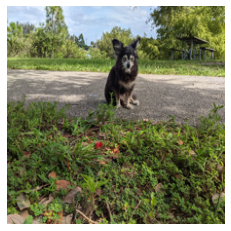

In [ ]:
predict("https://i.ibb.co/2700Rv7/o6.jpg", 'fullPrediction_19.jpg')

1/1 [==============================] - 0s 136ms/step
48.51% 	 golden_retriever
20.41% 	 redbone
18.55% 	 Labrador_retriever
3.32% 	 Rhodesian_ridgeback
2.37% 	 Chesapeake_Bay_retriever


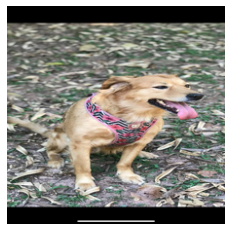

In [ ]:
predict("https://i.ibb.co/0GxLF47/o7.jpg", 'fullPrediction_20.jpg')

1/1 [==============================] - 0s 130ms/step
88.47% 	 golden_retriever
6.94% 	 Saluki
3.78% 	 redbone
0.45% 	 cocker_spaniel
0.32% 	 Labrador_retriever


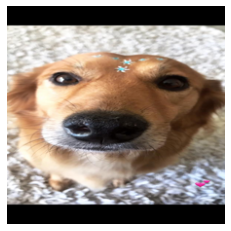

In [ ]:
predict("https://i.ibb.co/pQs1Dy4/o8.jpg", 'fullPrediction_20.jpg')

1/1 [==============================] - 0s 142ms/step
88.31% 	 Maltese_dog
10.46% 	 Lhasa
1.18% 	 Shih_Tzu
0.03% 	 Tibetan_terrier
0.01% 	 Yorkshire_terrier


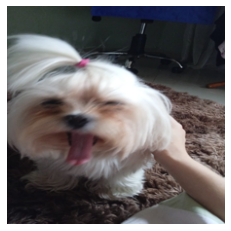

In [ ]:
predict("https://i.ibb.co/ZTzyy39/o1.jpg", 'fullPrediction_20.jpg')

1/1 [==============================] - 0s 144ms/step
45.04% 	 Maltese_dog
23.38% 	 Lhasa
14.03% 	 Shih_Tzu
7.90% 	 West_Highland_white_terrier
5.11% 	 Tibetan_terrier


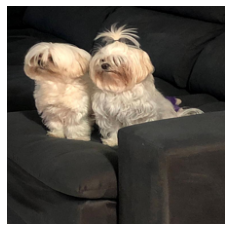

In [ ]:
predict("https://i.ibb.co/4Sm8zKK/o10.jpg", 'fullPrediction_21.jpg')

1/1 [==============================] - 0s 158ms/step
88.45% 	 Shih_Tzu
10.56% 	 Lhasa
0.89% 	 Tibetan_terrier
0.06% 	 Pekinese
0.03% 	 affenpinscher


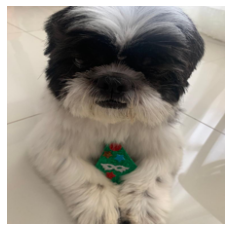

In [ ]:

predict("https://i.ibb.co/MCbvDRN/o11.jpg", 'fullPrediction_22.jpg')

### **Trying with a Reduced Dataset**



In [ ]:
#ten breeds
image_dir_ten = '/content/gdrive/MyDrive/AI4ALL/Project/v4/Images/tenbreeds/images/'
image_dir_ten_edited = '/content/gdrive/MyDrive/AI4ALL/Project/v4/Images/tenbreeds/editedtenImages/'
lists_dir_ten = '/content/gdrive/MyDrive/AI4ALL/Project/v4/Lists/tenbreeds/'
annotation_dir_ten = '/content/gdrive/MyDrive/AI4ALL/Project/v4/Annotation/tenbreeds/'

In [ ]:
dogbreeds_list_ten = pd.read_csv(lists_dir_ten + 'tendogs_file_list.csv')

#make a separate copy of the all dogs-ten original df
dogbreeds_list_ten_df = dogbreeds_list_ten.copy()

#visualize head of dataframe
dogbreeds_list_ten_df.head()

,file_list,annotation_list,labels
0,'n02085620-Chihuahua/n02085620_10074.jpg','n02085620-Chihuahua/n02085620_10074',1
1,'n02085620-Chihuahua/n02085620_10131.jpg','n02085620-Chihuahua/n02085620_10131',1
2,'n02085620-Chihuahua/n02085620_10621.jpg','n02085620-Chihuahua/n02085620_10621',1
3,'n02085620-Chihuahua/n02085620_1073.jpg','n02085620-Chihuahua/n02085620_1073',1
4,'n02085620-Chihuahua/n02085620_10976.jpg','n02085620-Chihuahua/n02085620_10976',1


In [ ]:
#number or records and number of unique records for the ten breeds dataset
ten_breeds = len(dogbreeds_list_ten_df['labels'].unique())
print("The original dataset contains ",len(dogbreeds_list_ten_df), ' images of dogs, and ',ten_breeds, " breeds.")

The original dataset contains  1687  images of dogs, and  10  breeds.


In [ ]:
#shape of ten dataframe
dogbreeds_list_ten_df.shape

(1687, 3)

In [ ]:
#get the names of the ten breeds in the dataset, split "annotation_list"
dogbreeds_list_ten_df[['folder_list','file']] = dogbreeds_list_ten_df.annotation_list.str.split("/", expand= True)
dogbreeds_list_ten_df

,file_list,annotation_list,labels,folder_list,file
0,'n02085620-Chihuahua/n02085620_10074.jpg','n02085620-Chihuahua/n02085620_10074',1,'n02085620-Chihuahua,n02085620_10074'
1,'n02085620-Chihuahua/n02085620_10131.jpg','n02085620-Chihuahua/n02085620_10131',1,'n02085620-Chihuahua,n02085620_10131'
2,'n02085620-Chihuahua/n02085620_10621.jpg','n02085620-Chihuahua/n02085620_10621',1,'n02085620-Chihuahua,n02085620_10621'
3,'n02085620-Chihuahua/n02085620_1073.jpg','n02085620-Chihuahua/n02085620_1073',1,'n02085620-Chihuahua,n02085620_1073'
4,'n02085620-Chihuahua/n02085620_10976.jpg','n02085620-Chihuahua/n02085620_10976',1,'n02085620-Chihuahua,n02085620_10976'
...,...,...,...,...,...
1682,'n02115641-dingo/n02115641_9675.jpg','n02115641-dingo/n02115641_9675',118,'n02115641-dingo,n02115641_9675'
1683,'n02115641-dingo/n02115641_9686.jpg','n02115641-dingo/n02115641_9686',118,'n02115641-dingo,n02115641_9686'
1684,'n02115641-dingo/n02115641_970.jpg','n02115641-dingo/n02115641_970',118,'n02115641-dingo,n02115641_970'
1685,'n02115641-dingo/n02115641_9763.jpg','n02115641-dingo/n02115641_9763',118,'n02115641-dingo,n02115641_9763'


In [ ]:
#get the names of ten breeds in the dataset, split "folder_list"
dogbreeds_list_ten_df[['breedid','breed']]=dogbreeds_list_ten_df['folder_list'].str.split("-",expand=True)

#split dog breed strings separated by "_"
dogbreeds_list_ten_df[['temp1','temp2']] = dogbreeds_list_ten_df['breed'].str.split("_", expand=True)

#concatenate the strings from the  temporary fields, don't add anything if it is a nan
dogbreeds_list_ten_df['dogbreed'] = dogbreeds_list_ten_df['temp1'] + " " + dogbreeds_list_ten_df['temp2'].fillna('')

#drop the temporary columns
dogbreeds_list_ten_df.drop(columns=['temp1','temp2'], axis=1, inplace=True)

#remove trailing white spaces
dogbreeds_list_ten_df['dogbreed'] = dogbreeds_list_ten_df['dogbreed'].str.strip()
dogbreeds_list_ten_df

,file_list,annotation_list,labels,folder_list,file,breedid,breed,dogbreed
0,'n02085620-Chihuahua/n02085620_10074.jpg','n02085620-Chihuahua/n02085620_10074',1,'n02085620-Chihuahua,n02085620_10074','n02085620,Chihuahua,Chihuahua
1,'n02085620-Chihuahua/n02085620_10131.jpg','n02085620-Chihuahua/n02085620_10131',1,'n02085620-Chihuahua,n02085620_10131','n02085620,Chihuahua,Chihuahua
2,'n02085620-Chihuahua/n02085620_10621.jpg','n02085620-Chihuahua/n02085620_10621',1,'n02085620-Chihuahua,n02085620_10621','n02085620,Chihuahua,Chihuahua
3,'n02085620-Chihuahua/n02085620_1073.jpg','n02085620-Chihuahua/n02085620_1073',1,'n02085620-Chihuahua,n02085620_1073','n02085620,Chihuahua,Chihuahua
4,'n02085620-Chihuahua/n02085620_10976.jpg','n02085620-Chihuahua/n02085620_10976',1,'n02085620-Chihuahua,n02085620_10976','n02085620,Chihuahua,Chihuahua
...,...,...,...,...,...,...,...,...
1682,'n02115641-dingo/n02115641_9675.jpg','n02115641-dingo/n02115641_9675',118,'n02115641-dingo,n02115641_9675','n02115641,dingo,dingo
1683,'n02115641-dingo/n02115641_9686.jpg','n02115641-dingo/n02115641_9686',118,'n02115641-dingo,n02115641_9686','n02115641,dingo,dingo
1684,'n02115641-dingo/n02115641_970.jpg','n02115641-dingo/n02115641_970',118,'n02115641-dingo,n02115641_970','n02115641,dingo,dingo
1685,'n02115641-dingo/n02115641_9763.jpg','n02115641-dingo/n02115641_9763',118,'n02115641-dingo,n02115641_9763','n02115641,dingo,dingo


In [ ]:
#verify the length of strings
print("Length of ", dogbreeds_list_ten_df['dogbreed'][0]," is ", len(dogbreeds_list_ten_df['dogbreed'][0]))
print("Length of ", dogbreeds_list_ten_df['dogbreed'][1686]," is ", len(dogbreeds_list_ten_df['dogbreed'][1686]))

Length of  Chihuahua  is  9
Length of  dingo  is  5


In [ ]:
#get all the breed names and the number of images per breed
dog_breed_count_ten = dogbreeds_list_ten_df['dogbreed'].value_counts()
print("Number of images per breed")
#print("--------------------------")
print(dog_breed_count_ten.to_markdown())

Number of images per breed
|                |   dogbreed |
|:---------------|-----------:|
| Samoyed        |        218 |
| pug            |        200 |
| Siberian husky |        192 |
| cocker spaniel |        159 |
| Scotch terrier |        158 |
| dingo          |        156 |
| Chihuahua      |        152 |
| Rottweiler     |        152 |
| toy poodle     |        151 |
| Pekinese       |        149 |


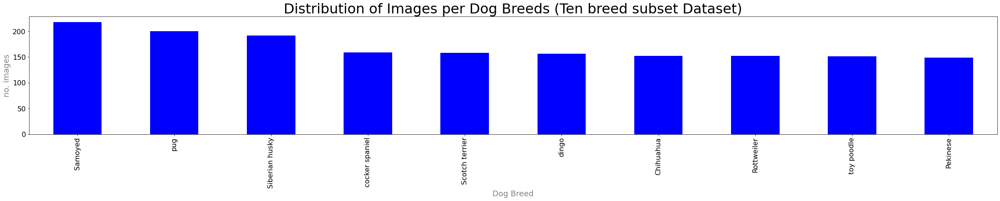

In [ ]:
plt.figure(figsize=(40,5))
dog_breed_count_ten.plot(kind="bar", color = 'blue')
plt.title("Dog Breeds (Ten)", fontsize = 24)

plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.title("Distribution of Images per Dog Breeds (Ten breed subset Dataset)", fontsize = 32, color='black')

plt.xlabel('Dog Breed', fontsize = 18, color='grey')
plt.ylabel('no. images', fontsize = 18, color='grey')
plt.show()

In [ ]:
#check images folder in google drive now for TEN
import os
dogbreeds_imageFolder_ten = os.listdir(image_dir_ten)
dogbreeds_imageFolder_ten_sorted = sorted(os.listdir(image_dir_ten))

In [ ]:
dogbreeds_imageFolder_ten_df = dogbreeds_imageFolder_ten.copy()

In [ ]:
dogbreeds_imageFolderList_ten_df = pd.DataFrame(dogbreeds_imageFolder_ten_df)
dogbreeds_imageFolderList_ten_df

,0
0,n02085620-Chihuahua
1,n02086079-Pekinese
2,n02097298-Scotch_terrier
3,n02111889-Samoyed
4,n02113624-toy_poodle
5,n02115641-dingo
6,n02110958-pug
7,n02102318-cocker_spaniel
8,n02110185-Siberian_husky
9,n02106550-Rottweiler


In [ ]:
dogbreeds_imageFolder_ten_df

['n02085620-Chihuahua',
 'n02086079-Pekinese',
 'n02097298-Scotch_terrier',
 'n02111889-Samoyed',
 'n02113624-toy_poodle',
 'n02115641-dingo',
 'n02110958-pug',
 'n02102318-cocker_spaniel',
 'n02110185-Siberian_husky',
 'n02106550-Rottweiler']

In [ ]:
dogbreeds_imageFolderList_ten_df.rename(columns={0: 'folder_breed'}, inplace=True)
dogbreeds_imageFolderList_ten_df
dogbreeds_imageFolderList_ten_df[['breedid','breed']] = dogbreeds_imageFolderList_ten_df['folder_breed'].str.split("-",expand=True)
dogbreeds_imageFolderList_ten_df

,folder_breed,breedid,breed
0,n02085620-Chihuahua,n02085620,Chihuahua
1,n02086079-Pekinese,n02086079,Pekinese
2,n02097298-Scotch_terrier,n02097298,Scotch_terrier
3,n02111889-Samoyed,n02111889,Samoyed
4,n02113624-toy_poodle,n02113624,toy_poodle
5,n02115641-dingo,n02115641,dingo
6,n02110958-pug,n02110958,pug
7,n02102318-cocker_spaniel,n02102318,cocker_spaniel
8,n02110185-Siberian_husky,n02110185,Siberian_husky
9,n02106550-Rottweiler,n02106550,Rottweiler


In [ ]:
#split dog breed strings separated by "_"
dogbreeds_imageFolderList_ten_df[['temp1','temp2']] = dogbreeds_imageFolderList_ten_df['breed'].str.split("_", expand=True)
#concatenate the strings from the  temporary fields, don't add anything if it is a nan
dogbreeds_imageFolderList_ten_df['dogbreed'] = dogbreeds_imageFolderList_ten_df['temp1'] + " " + dogbreeds_imageFolderList_ten_df['temp2'].fillna('')
#drop the temporary columns
dogbreeds_imageFolderList_ten_df.drop(columns=['temp1','temp2'], axis=1, inplace=True)

#remove trailing white spaces
dogbreeds_imageFolderList_ten_df['dogbreed'] = dogbreeds_imageFolderList_ten_df['dogbreed'].str.upper()
dogbreeds_imageFolderList_ten_df['dogbreed'] = dogbreeds_imageFolderList_ten_df['dogbreed'].str.strip()
dogbreeds_imageFolderList_ten_df

,folder_breed,breedid,breed,dogbreed
0,n02085620-Chihuahua,n02085620,Chihuahua,CHIHUAHUA
1,n02086079-Pekinese,n02086079,Pekinese,PEKINESE
2,n02097298-Scotch_terrier,n02097298,Scotch_terrier,SCOTCH TERRIER
3,n02111889-Samoyed,n02111889,Samoyed,SAMOYED
4,n02113624-toy_poodle,n02113624,toy_poodle,TOY POODLE
5,n02115641-dingo,n02115641,dingo,DINGO
6,n02110958-pug,n02110958,pug,PUG
7,n02102318-cocker_spaniel,n02102318,cocker_spaniel,COCKER SPANIEL
8,n02110185-Siberian_husky,n02110185,Siberian_husky,SIBERIAN HUSKY
9,n02106550-Rottweiler,n02106550,Rottweiler,ROTTWEILER


In [ ]:
mainEdittenImages = False
subEdittenImages = False

editedtenImagesPath = image_dir_ten_edited
mainEdittenImages = os.path.exists(editedtenImagesPath)
print(mainEdittenImages)

True


In [ ]:
dogbreeds_imageFolderList_ten_df['folder_breed']

0         n02085620-Chihuahua
1          n02086079-Pekinese
2    n02097298-Scotch_terrier
3           n02111889-Samoyed
4        n02113624-toy_poodle
5             n02115641-dingo
6               n02110958-pug
7    n02102318-cocker_spaniel
8    n02110185-Siberian_husky
9        n02106550-Rottweiler
Name: folder_breed, dtype: object

In [ ]:
#main folder does not exist
if not mainEdittenImages:
  # Create directory to store editedImages
  os.makedirs(editedtenImagesPath)

 #prepare to create subfolders for every dog breed
  for dogbreed_folder in dogbreeds_imageFolderList_ten_df['folder_breed']:
    subEdittenImagesPath = image_dir_ten_edited + dogbreed_folder
    subEdittenImages = os.path.exists(subEdittenImagesPath)

    #now check if sub folders exist
    #subfolder does not exist:
    if not subEdittenImages:
      os.mkdir(subEdittenImagesPath)
      print('Created {} subfolder to store cropped images.'.format(dogbreed_folder))
    #subfolder exists
    else:
      print('Did not create {} subfolder to store cropped image. Already existed.'.format(dogbreed_folder))

#main folder exists
else:
  print("Folder <editedImages> not created. Already existed.")

  #prepare to create subfolders for every dog breed if necessary
  for dogbreed_folder in dogbreeds_imageFolderList_ten_df['folder_breed']:
    subEdittenImagesPath = image_dir_ten_edited + dogbreed_folder
    subEdittenImages = os.path.exists(subEdittenImagesPath)

    #main folder exists, but subfolders don't exist
    if not subEdittenImages:
      os.mkdir(subEdittenImagesPath)
      print('Created {} subfolder to store cropped images.'.format(dogbreed_folder))
    #main folder exists and subfolders exist
    else:
      print('Did not create {} subfolder to store cropped image. Already existed.'.format(dogbreed_folder))

Folder <editedImages> not created. Already existed.
Did not create n02085620-Chihuahua subfolder to store cropped image. Already existed.
Did not create n02086079-Pekinese subfolder to store cropped image. Already existed.
Did not create n02097298-Scotch_terrier subfolder to store cropped image. Already existed.
Did not create n02111889-Samoyed subfolder to store cropped image. Already existed.
Did not create n02113624-toy_poodle subfolder to store cropped image. Already existed.
Did not create n02115641-dingo subfolder to store cropped image. Already existed.
Did not create n02110958-pug subfolder to store cropped image. Already existed.
Did not create n02102318-cocker_spaniel subfolder to store cropped image. Already existed.
Did not create n02110185-Siberian_husky subfolder to store cropped image. Already existed.
Did not create n02106550-Rottweiler subfolder to store cropped image. Already existed.


# **Access Annotation Files**

We need to access the Annotation files for each image that contain size, bounding, and depth information.

# ElementTree is a python built-in library to read and manipulate XML files. We are going to use it to access the Annotation files that are in JSON format.

In [ ]:
#import ElementTree
import xml.etree.ElementTree as ET

#so the first image is 0 as the first index
imgno = 0

#now lets try resizing

#loop through the e are going to use the annotation directory
for dogbreed_folder in os.listdir(editedtenImagesPath):

    #loop through the annotation directory
    for file in os.listdir(annotation_dir_ten+'{}'.format(dogbreed_folder)):
        img = Image.open(image_dir_ten+'{}/{}.jpg'.format(dogbreed_folder, file))
        tree = ET.parse(annotation_dir_ten + '{}/{}'.format(dogbreed_folder, file))
        xmin = int(tree.getroot().findall('object')[0].find('bndbox').find('xmin').text)
        xmax = int(tree.getroot().findall('object')[0].find('bndbox').find('xmax').text)
        ymin = int(tree.getroot().findall('object')[0].find('bndbox').find('ymin').text)
        ymax = int(tree.getroot().findall('object')[0].find('bndbox').find('ymax').text)
        img = img.crop((xmin, ymin, xmax, ymax))
        img = img.convert('RGB')
        img = img.resize((224, 224))
        imgno = imgno +1
        per = (imgno/len(dogbreeds_list_ten_df))*100
        img.save(editedtenImagesPath + dogbreed_folder + '/' + file + '.jpg')
        print("Saved Img# "+str(imgno)+" : "+str(f'{per:.3f}')+"% "+editedtenImagesPath + dogbreed_folder + '/' + file + '.jpg')

Saved Img# 1 : 0.059% /content/gdrive/MyDrive/AI4ALL/Project/v4/Images/tenbreeds/editedtenImages/n02085620-Chihuahua/n02085620_10621.jpg
Saved Img# 2 : 0.119% /content/gdrive/MyDrive/AI4ALL/Project/v4/Images/tenbreeds/editedtenImages/n02085620-Chihuahua/n02085620_1073.jpg
Saved Img# 3 : 0.178% /content/gdrive/MyDrive/AI4ALL/Project/v4/Images/tenbreeds/editedtenImages/n02085620-Chihuahua/n02085620_10131.jpg
Saved Img# 4 : 0.237% /content/gdrive/MyDrive/AI4ALL/Project/v4/Images/tenbreeds/editedtenImages/n02085620-Chihuahua/n02085620_10074.jpg
Saved Img# 5 : 0.296% /content/gdrive/MyDrive/AI4ALL/Project/v4/Images/tenbreeds/editedtenImages/n02085620-Chihuahua/n02085620_11238.jpg
Saved Img# 6 : 0.356% /content/gdrive/MyDrive/AI4ALL/Project/v4/Images/tenbreeds/editedtenImages/n02085620-Chihuahua/n02085620_11258.jpg
Saved Img# 7 : 0.415% /content/gdrive/MyDrive/AI4ALL/Project/v4/Images/tenbreeds/editedtenImages/n02085620-Chihuahua/n02085620_10976.jpg
Saved Img# 8 : 0.474% /content/gdrive/MyDr

# **Training the model**

In [ ]:
editedtenImagesPath

'/content/gdrive/MyDrive/AI4ALL/Project/v4/Images/tenbreeds/editedtenImages/'

In [ ]:
breed_list_ten = os.listdir(image_dir_ten_edited)
breed_list_ten

['n02085620-Chihuahua',
 'n02086079-Pekinese',
 'n02097298-Scotch_terrier',
 'n02111889-Samoyed',
 'n02113624-toy_poodle',
 'n02115641-dingo',
 'n02110958-pug',
 'n02102318-cocker_spaniel',
 'n02110185-Siberian_husky',
 'n02106550-Rottweiler']

In [ ]:
dogbreeds_imageFolder_ten_df

['n02085620-Chihuahua',
 'n02086079-Pekinese',
 'n02097298-Scotch_terrier',
 'n02111889-Samoyed',
 'n02113624-toy_poodle',
 'n02115641-dingo',
 'n02110958-pug',
 'n02102318-cocker_spaniel',
 'n02110185-Siberian_husky',
 'n02106550-Rottweiler']

In [ ]:
num_classes = len(breed_list_ten)


In [ ]:
print(num_classes)

10


In [ ]:
dict_label = {}
dict_reverse_label = {}
for i, v in enumerate(breed_list_ten):
    dict_label.update({v: i})
    dict_reverse_label.update({i : v})

In [ ]:
dict_label

{'n02085620-Chihuahua': 0,
 'n02086079-Pekinese': 1,
 'n02097298-Scotch_terrier': 2,
 'n02111889-Samoyed': 3,
 'n02113624-toy_poodle': 4,
 'n02115641-dingo': 5,
 'n02110958-pug': 6,
 'n02102318-cocker_spaniel': 7,
 'n02110185-Siberian_husky': 8,
 'n02106550-Rottweiler': 9}

In [ ]:
dict_reverse_label

{0: 'n02085620-Chihuahua',
 1: 'n02086079-Pekinese',
 2: 'n02097298-Scotch_terrier',
 3: 'n02111889-Samoyed',
 4: 'n02113624-toy_poodle',
 5: 'n02115641-dingo',
 6: 'n02110958-pug',
 7: 'n02102318-cocker_spaniel',
 8: 'n02110185-Siberian_husky',
 9: 'n02106550-Rottweiler'}

In [ ]:
dogbreeds_imageFolder_ten_df

['n02085620-Chihuahua',
 'n02086079-Pekinese',
 'n02097298-Scotch_terrier',
 'n02111889-Samoyed',
 'n02113624-toy_poodle',
 'n02115641-dingo',
 'n02110958-pug',
 'n02102318-cocker_spaniel',
 'n02110185-Siberian_husky',
 'n02106550-Rottweiler']

In [ ]:
#Paths definition
def labelspaths():
  #create three empty lists
    paths = list()
    labels = list()
    targets = list()

    for breed in dogbreeds_imageFolder_ten_df:
        base_name = editedtenImagesPath+"{}/".format(breed)
        print("base_name: ",base_name)
        for image_name in os.listdir(base_name):
            paths.append(base_name + image_name)
            labels.append(breed)
            targets.append(dict_label[breed])
    return paths, labels, targets

paths, labels, targets = labelspaths()

assert len(paths) == len(labels)
assert len(paths) == len(targets)

targets = np_utils.to_categorical(targets, num_classes=num_classes)

base_name:  /content/gdrive/MyDrive/AI4ALL/Project/v4/Images/tenbreeds/editedtenImages/n02085620-Chihuahua/
base_name:  /content/gdrive/MyDrive/AI4ALL/Project/v4/Images/tenbreeds/editedtenImages/n02086079-Pekinese/
base_name:  /content/gdrive/MyDrive/AI4ALL/Project/v4/Images/tenbreeds/editedtenImages/n02097298-Scotch_terrier/
base_name:  /content/gdrive/MyDrive/AI4ALL/Project/v4/Images/tenbreeds/editedtenImages/n02111889-Samoyed/
base_name:  /content/gdrive/MyDrive/AI4ALL/Project/v4/Images/tenbreeds/editedtenImages/n02113624-toy_poodle/
base_name:  /content/gdrive/MyDrive/AI4ALL/Project/v4/Images/tenbreeds/editedtenImages/n02115641-dingo/
base_name:  /content/gdrive/MyDrive/AI4ALL/Project/v4/Images/tenbreeds/editedtenImages/n02110958-pug/
base_name:  /content/gdrive/MyDrive/AI4ALL/Project/v4/Images/tenbreeds/editedtenImages/n02102318-cocker_spaniel/
base_name:  /content/gdrive/MyDrive/AI4ALL/Project/v4/Images/tenbreeds/editedtenImages/n02110185-Siberian_husky/
base_name:  /content/gdri

In [ ]:
targets

array([[1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.]], dtype=float32)

In [ ]:
batch_size = 64

class ImageGenerator(Sequence):

    def __init__(self, paths, targets, batch_size, shape, augment=False):
        self.paths = paths
        self.targets = targets
        self.batch_size = batch_size
        self.shape = shape
        self.augment = augment

    def __len__(self):
        return int(np.ceil(len(self.paths) / float(self.batch_size)))

    def __getitem__(self, idx):
        batch_paths = self.paths[idx * self.batch_size : (idx + 1) * self.batch_size]
        x = np.zeros((len(batch_paths), self.shape[0], self.shape[1], self.shape[2]), dtype=np.float32)
        y = np.zeros((self.batch_size, num_classes, 1))
        for i, path in enumerate(batch_paths):
            x[i] = self.__load_image(path)
        y = self.targets[idx * self.batch_size : (idx + 1) * self.batch_size]
        return x, y

    def __iter__(self):
        for item in (self[i] for i in range(len(self))):
            yield item

    def __load_image(self, path):
        image = imread(path)
        image = preprocess_input(image)
        if self.augment:
            seq = iaa.Sequential([
                iaa.OneOf([
                    iaa.Fliplr(0.5),
                    iaa.Flipud(0.5),
                    iaa.CropAndPad(percent=(-0.25, 0.25)),
                    iaa.Crop(percent=(0, 0.1)),
                    iaa.Sometimes(0.5,
                        iaa.GaussianBlur(sigma=(0, 0.5))
                    ),
                    iaa.Affine(
                        scale={"x": (0.8, 1.2), "y": (0.8, 1.2)},
                        translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)},
                        rotate=(-180, 180),
                        shear=(-8, 8)
                    )
                ])
            ], random_order=True)
            image = seq.augment_image(image)
        return image

In [ ]:
train_paths, val_paths, train_targets, val_targets = train_test_split(paths,
                                                  targets,
                                                  test_size=0.15,
                                                  random_state=1029)

train_gen = ImageGenerator(train_paths, train_targets, batch_size=32, shape=(224,224,3), augment=True)
val_gen = ImageGenerator(val_paths, val_targets, batch_size=32, shape=(224,224,3), augment=False)

In [ ]:
inp = Input((224, 224, 3))
backbone = DenseNet121(input_tensor=inp,
                       weights="imagenet",
                       include_top=False)
x = backbone.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation="relu")(x)
x = Dropout(0.5)(x)
x = Dense(512, activation="relu")(x)
x = Dropout(0.5)(x)
outp = Dense(num_classes, activation="softmax")(x)

model = Model(inp, outp)

29084464/29084464 [==============================] - 0s 0us/step


In [ ]:
for layer in model.layers[:-6]:
    layer.trainable = False

What is an optimizer

Keras available Optimizers:

- Adadelta
- Adagrad
- Adam
- Adamax
- Ftrl
- Nadam
- SGD
- RMSProp


Keras available losses

Probabilistic losses
- BinaryCrossentropy class
- CategoricalCrossentropy class
- SparseCategoricalCrossentropy class
- Poisson class
- binary_crossentropy function
- categorical_crossentropy function
- sparse_categorical_crossentropy function
- poisson function
- KLDivergence class
- kl_divergence function

Regression losses
- MeanSquaredError class
- MeanAbsoluteError class
- MeanAbsolutePercentageError class
- MeanSquaredLogarithmicError class
- CosineSimilarity class
- mean_squared_error function
- mean_absolute_error function
- mean_absolute_percentage_error function
- mean_squared_logarithmic_error function
- cosine_similarity function
- Huber class
- huber function
- LogCosh class
- log_cosh function

Hinge losses for "maximum-margin" classification
- Hinge class
- SquaredHinge class
- CategoricalHinge class
- hinge function
- squared_hinge function
- categorical_hinge function

Available metrics
Accuracy metrics
Accuracy class
BinaryAccuracy class
CategoricalAccuracy class
SparseCategoricalAccuracy class
TopKCategoricalAccuracy class
SparseTopKCategoricalAccuracy class
Probabilistic metrics
BinaryCrossentropy class
CategoricalCrossentropy class
SparseCategoricalCrossentropy class
KLDivergence class
Poisson class
Regression metrics
MeanSquaredError class
RootMeanSquaredError class
MeanAbsoluteError class
MeanAbsolutePercentageError class
MeanSquaredLogarithmicError class
CosineSimilarity class
LogCoshError class
Classification metrics based on True/False positives & negatives
AUC class
Precision class
Recall class
TruePositives class
TrueNegatives class
FalsePositives class
FalseNegatives class
PrecisionAtRecall class
SensitivityAtSpecificity class
SpecificityAtSensitivity class
Image segmentation metrics
MeanIoU class
Hinge metrics for "maximum-margin" classification
Hinge class
SquaredHinge class
CategoricalHinge class

In [ ]:
model.compile(optimizer="adam",
              loss="categorical_crossentropy",
              metrics=["acc"])

In [ ]:
history = model.fit_generator(generator=train_gen,
                              steps_per_epoch=len(train_gen),
                              validation_data=val_gen,
                              validation_steps=len(val_gen),
                              epochs=20)

Epoch 1/20
45/45 [==============================] - 337s 7s/step - loss: 0.9519 - acc: 0.6957 - val_loss: 0.0651 - val_acc: 0.9843
Epoch 2/20
45/45 [==============================] - 26s 581ms/step - loss: 0.3553 - acc: 0.8828 - val_loss: 0.0525 - val_acc: 0.9803
Epoch 3/20
45/45 [==============================] - 27s 594ms/step - loss: 0.2681 - acc: 0.9142 - val_loss: 0.0484 - val_acc: 0.9803
Epoch 4/20
45/45 [==============================] - 27s 601ms/step - loss: 0.2713 - acc: 0.9107 - val_loss: 0.0560 - val_acc: 0.9843
Epoch 5/20
45/45 [==============================] - 27s 596ms/step - loss: 0.2405 - acc: 0.9204 - val_loss: 0.0434 - val_acc: 0.9921
Epoch 6/20
45/45 [==============================] - 28s 613ms/step - loss: 0.2148 - acc: 0.9232 - val_loss: 0.0643 - val_acc: 0.9764
Epoch 7/20
45/45 [==============================] - 27s 604ms/step - loss: 0.2169 - acc: 0.9309 - val_loss: 0.0436 - val_acc: 0.9882
Epoch 8/20
45/45 [==============================] - 28s 612ms/step - lo

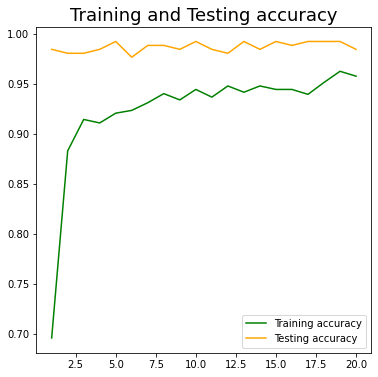

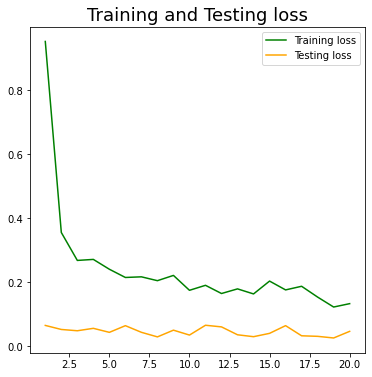

In [ ]:
plt.rcParams['figure.figsize'] = (6,6)

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(acc) + 1)

plt.title('Training and Testing accuracy', fontsize = 18)
plt.plot(epochs, acc, 'green', label='Training accuracy')
plt.plot(epochs, val_acc, 'orange', label='Testing accuracy')
plt.legend()

plt.figure()
plt.title('Training and Testing loss', fontsize= 18)
plt.plot(epochs, loss, 'green', label='Training loss')
plt.plot(epochs, val_loss, 'orange', label='Testing loss')

plt.legend()

plt.show()

In [ ]:
for layer in model.layers[:]:
    layer.trainable = True

**ModelCheckpoint callback **

used in conjunction with training using model.fit() to save a model or weights (in a checkpoint file) at some interval, so the model or weights can be loaded later to continue the training from the state saved.

In [ ]:
# a check point callback to save our best weights
best_weights = ModelCheckpoint('model_dogbreeds_classify.h5',
                             monitor='val_acc',
                             verbose=1,
                             save_best_only=True,
                             mode='max',
                             save_weights_only=True)

# a reducing lr callback to reduce lr when val_loss doesn't increase
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                                   patience=1, verbose=1, mode='min',
                                   min_delta=0.0001, cooldown=2, min_lr=1e-7)

# for early stop
early_stop = EarlyStopping(monitor="val_loss", mode="min", patience=5)

In [ ]:
training_log = model.fit_generator(generator=train_gen,
                              steps_per_epoch=len(train_gen),
                              validation_data=val_gen,
                              validation_steps=len(val_gen),
                              epochs=20,
                              callbacks=[best_weights, reduce_lr, early_stop])

Epoch 1/20
45/45 [==============================] - ETA: 0s - loss: 0.1403 - acc: 0.9498
Epoch 1: val_acc improved from -inf to 0.99213, saving model to model_dogbreeds_classify.h5
45/45 [==============================] - 28s 617ms/step - loss: 0.1403 - acc: 0.9498 - val_loss: 0.0231 - val_acc: 0.9921 - lr: 0.0010
Epoch 2/20
45/45 [==============================] - ETA: 0s - loss: 0.1054 - acc: 0.9672
Epoch 2: val_acc did not improve from 0.99213

Epoch 2: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.
45/45 [==============================] - 27s 602ms/step - loss: 0.1054 - acc: 0.9672 - val_loss: 0.0489 - val_acc: 0.9803 - lr: 0.0010
Epoch 3/20
45/45 [==============================] - ETA: 0s - loss: 0.1035 - acc: 0.9672
Epoch 3: val_acc did not improve from 0.99213
45/45 [==============================] - 27s 606ms/step - loss: 0.1035 - acc: 0.9672 - val_loss: 0.0313 - val_acc: 0.9921 - lr: 2.0000e-04
Epoch 4/20
45/45 [==============================] - ETA: 0s - 

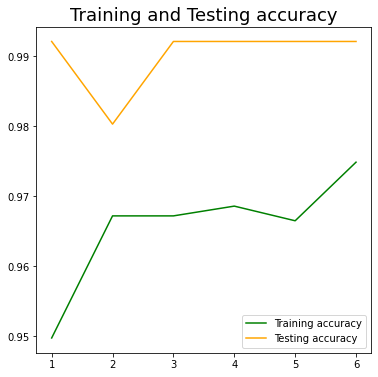

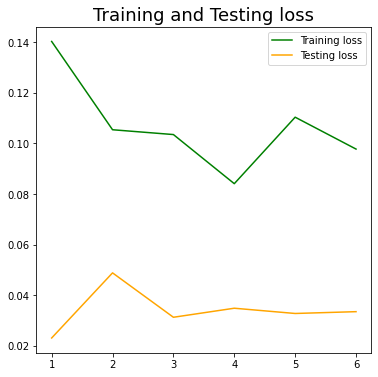

In [ ]:
plt.rcParams['figure.figsize'] = (6,6)

acc = training_log.history['acc']
val_acc = training_log.history['val_acc']
loss = training_log.history['loss']
val_loss = training_log.history['val_loss']
epochs = range(1, len(acc) + 1)

plt.title('Training and Testing accuracy', fontsize = 18)
plt.plot(epochs, acc, 'green', label='Training accuracy')
plt.plot(epochs, val_acc, 'orange', label='Testing accuracy')
plt.legend()

plt.figure()
plt.title('Training and Testing loss', fontsize = 18)
plt.plot(epochs, loss, 'green', label='Training loss')
plt.plot(epochs, val_loss, 'orange', label='Testing loss')

plt.legend()

plt.show()

In [ ]:
print(max(val_acc))

0.9921259880065918


In [ ]:
def predict(url, filename):
    # download and save
    os.system("curl -s {} -o {}".format(url, filename))
    img = Image.open(filename)
    img = img.convert('RGB')
    img = img.resize((224, 224))
    img.save(filename)
    # show image
    plt.figure(figsize=(4, 4))
    plt.imshow(img)
    plt.axis('off')
    # predict
    img = imread(filename)
    img = preprocess_input(img)
    probs = model.predict(np.expand_dims(img, axis=0))
    for idx in probs.argsort()[0][::-1][:5]:
        print("{:.2f}%".format(probs[0][idx]*100), "\t", dict_reverse_label[idx].split("-")[-1])

1/1 [==============================] - 2s 2s/step
100.00% 	 dingo
0.00% 	 Chihuahua
0.00% 	 Siberian_husky
0.00% 	 cocker_spaniel
0.00% 	 Rottweiler


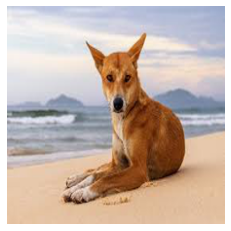

In [ ]:
predict("https://i.ibb.co/VmPP96F/dingo-2.jpg", 'tenPrediction_1.jpg')

1/1 [==============================] - 0s 98ms/step
100.00% 	 Rottweiler
0.00% 	 Chihuahua
0.00% 	 cocker_spaniel
0.00% 	 dingo
0.00% 	 Scotch_terrier


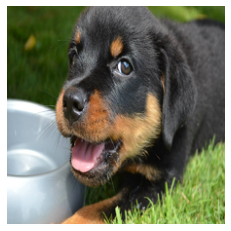

In [ ]:
predict("https://i.ibb.co/Ypvdnrc/rotweiler-2.jpg", 'tenPrediction_2.jpg')

1/1 [==============================] - 0s 108ms/step
100.00% 	 Pekinese
0.00% 	 cocker_spaniel
0.00% 	 Chihuahua
0.00% 	 pug
0.00% 	 toy_poodle


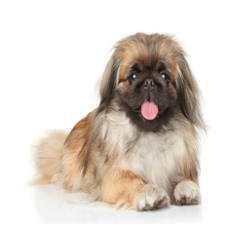

In [ ]:
predict("https://i.ibb.co/BK5DcCP/pekinese-2.jpg", 'tenPrediction_3.jpg')

1/1 [==============================] - 0s 105ms/step
100.00% 	 pug
0.00% 	 Chihuahua
0.00% 	 Rottweiler
0.00% 	 Pekinese
0.00% 	 Siberian_husky


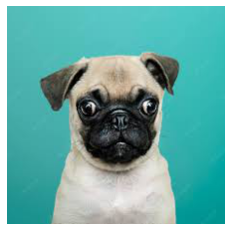

In [ ]:
predict("https://i.ibb.co/rxpxtmc/pug-2.jpg", 'tenPrediction_4.jpg')

1/1 [==============================] - 0s 109ms/step
88.01% 	 Scotch_terrier
9.75% 	 Samoyed
1.51% 	 toy_poodle
0.34% 	 Chihuahua
0.13% 	 cocker_spaniel


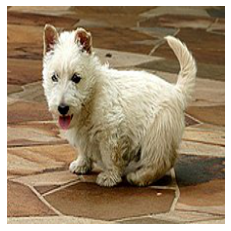

In [ ]:
predict("https://i.ibb.co/gd4kMNL/scotch-terrier-2.jpg", 'tenPrediction_5.jpg')

1/1 [==============================] - 0s 99ms/step
99.98% 	 Samoyed
0.02% 	 toy_poodle
0.00% 	 Pekinese
0.00% 	 Siberian_husky
0.00% 	 Chihuahua


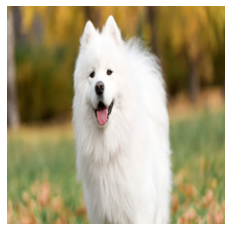

In [ ]:
predict("https://i.ibb.co/7byshZL/samoyed-2.jpg", 'tenPrediction_6.jpg')

1/1 [==============================] - 0s 107ms/step
98.89% 	 Chihuahua
1.08% 	 dingo
0.01% 	 Scotch_terrier
0.01% 	 pug
0.00% 	 Siberian_husky


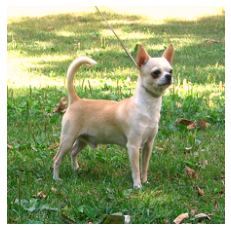

In [ ]:
predict("https://i.ibb.co/Zcgrkb1/chihuahua-2.jpg", 'tenPrediction_7.jpg')

1/1 [==============================] - 0s 110ms/step
99.99% 	 cocker_spaniel
0.01% 	 dingo
0.00% 	 toy_poodle
0.00% 	 Pekinese
0.00% 	 Rottweiler


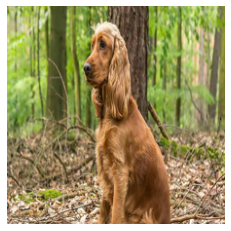

In [ ]:
predict("https://i.ibb.co/hmzHRfq/cocker-spaniel-2.jpg", 'tenPrediction_8.jpg')

1/1 [==============================] - 0s 111ms/step
99.98% 	 toy_poodle
0.02% 	 Scotch_terrier
0.00% 	 cocker_spaniel
0.00% 	 Samoyed
0.00% 	 Chihuahua


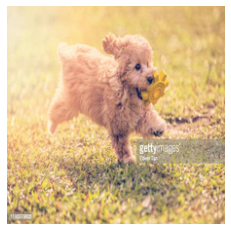

In [ ]:
predict("https://i.ibb.co/gW4MPkS/toy-poodle-2.jpg", 'tenPrediction_9.jpg')

1/1 [==============================] - 0s 102ms/step
100.00% 	 Siberian_husky
0.00% 	 dingo
0.00% 	 Samoyed
0.00% 	 Chihuahua
0.00% 	 pug


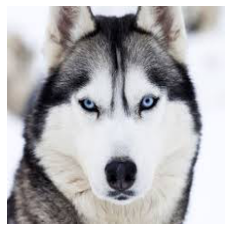

In [ ]:
predict("https://i.ibb.co/G3G0XFL/siberian-husky-2.jpg", 'tenPrediction_10.jpg')

In [ ]:
predict("https://i.ibb.co/VS0F3Tw/shibainu.gif", 'tenPrediction_11.jpg')

1/1 [==============================] - 0s 111ms/step
74.81% 	 dingo
9.71% 	 pug
8.76% 	 Chihuahua
2.31% 	 Siberian_husky
2.25% 	 Rottweiler


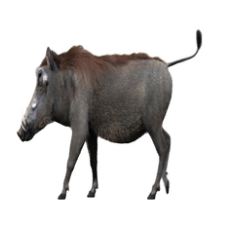

In [ ]:
predict("https://i.ibb.co/xj4RWgF/boar.jpg", 'tenPrediction_12.jpg')

1/1 [==============================] - 0s 104ms/step
48.77% 	 Chihuahua
13.60% 	 Siberian_husky
7.55% 	 pug
7.46% 	 toy_poodle
6.74% 	 Scotch_terrier


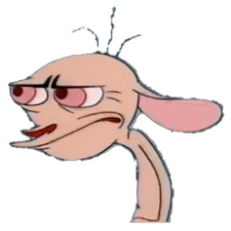

In [ ]:
predict("https://i.ibb.co/5FHLYHL/ren.jpg", 'tenPrediction_14.jpg')